In [10]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [11]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import readdy
import math
import scipy

import pandas as pd
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
import contextlib
import io
import pickle
import torch
from botorch.models import SingleTaskGP
from botorch.models.transforms import Normalize, Standardize
from botorch.fit import fit_gpytorch_mll
from gpytorch.mlls import ExactMarginalLogLikelihood
from gpytorch.likelihoods import FixedNoiseGaussianLikelihood
from botorch.acquisition import LogExpectedImprovement
from botorch.acquisition import ExpectedImprovement
from botorch.acquisition import UpperConfidenceBound
from botorch.optim import optimize_acqf


import sys
import os
sys.path.append(os.path.abspath(os.path.join('..', 'python_scripts')))

from NCG_readdy_sim import Debye_length, Debye_Hueckel_pot_rep_strength ,Diff_at23C,visc_T,Diff_ES

from NCG_readdy_sim import run_sim_1,tcl_file_gen,all_types

from NCG_Bay_opt_readdy_sim import run_p,run_p_dict,gt_1_3,gt_1_1,gt_1_2,gt_1_4, cg_angle_distr_1_4_ba_aa_oa_la,cg_angle_distr_1_1_hp,cg_angle_distr_1_1_bm, eval_sim_1_1_la,eval_sim_1_1_hp,eval_sim_1_1_aa,eval_sim_1_2_ba_oa, eval_sim_1_4_ba_aa_oa_la,eval_sim_1_1_bm,apply_gp, run_gp_11

from NCG_Bay_opt_readdy_sim import gen_all_comb_from_list_of_lists_2

# Optimizing parameters of coarse grained nanomotif model

# Bayesian optimization with BoTorch implementation

Mechanical properties of motifs were captured in angle distributions from oxDNA simulations at nucleotide resolution. These serve as target for parameter optimization in a coarse grained model representing 8 nucleotides as single particle.

Bayesian optimization set up as 1D+(4D&1D)+1D+1D problem


# Units and temperature

In [12]:
#Set units used in ReaDDy and simulation temperature
custom_units = {'length_unit':'nanometer',
                'time_unit': 'nanoseconds',
                'energy_unit': 'joule'}
system_temperature=273.15 + 40  #293
kbt=system_temperature*1.380649*10**-23

# Diffusion constant

In [13]:
#Diffusion constant either based on Einstein-Smoluchowski, or on exp results for oligos at 23°C
# viscositiy: https://srd.nist.gov/jpcrdreprint/1.555581.pdf
# scaling diffusion constant with T: https://en.wikipedia.org/wiki/Einstein_relation_(kinetic_theory)
# Diffusion constant DNA oligos at 23°C: https://www.sciencedirect.com/science/article/pii/S0021925818310871


#Diffusion const for BP of ds DNA (known at 23°C)
Diff_at23C_1=Diff_at23C(8)

#Viscosity water at sim temp and 23°C
visc_T_sys=visc_T(system_temperature)
visc_T_23=visc_T(273.15+23)

#rescale diffusion const to sim temperature and viscosity (assume scaling like Einstein-Smoluchowski D= kb*T/(6*pi*r*visc) )
Diff_sys_temp=Diff_at23C_1*system_temperature/(23+273.15)  *visc_T_23/visc_T_sys

#use Einstein-Smoluchowski for sphere
Diff_sys_temp_ES=Diff_ES(T=system_temperature,r=2.72/2 *10**-9,eta=visc_T_sys)*10**9
Diff_T_23_ES=Diff_ES(T=23+273.15,r=2.72/2 *10**-9,eta=visc_T_sys)*10**9


print("D for 8bp at 23°C /",23+273.15,"K =",Diff_at23C_1,"nm^2/ns") 
print("D for sphere with r=2.72/2 nm at 23°C /",23+273.15,"K =", Diff_T_23_ES,"nm^2/ns")
print("############################################")
print("mu at",system_temperature-273.15,"°C /", system_temperature,"K =",visc_T_sys," Pa*s" )
print("mu at","23°C /", 23+273.15,"K =" ,visc_T_23," Pa*s" )
print("############################################")
print("D for 8bp at",system_temperature-273.15,"°C /",system_temperature,"K =",Diff_sys_temp,"nm^2/ns")
print("D for sphere with r=2.72/2 nm at" ,system_temperature-273.15,"°C /",system_temperature,"K =",Diff_sys_temp_ES,"nm^2/ns")


D for 8bp at 23°C / 296.15 K = 0.10964057118867664 nm^2/ns
D for sphere with r=2.72/2 nm at 23°C / 296.15 K = 0.2443607133764822 nm^2/ns
############################################
mu at 40.0 °C / 313.15 K = 0.0006527150159023826  Pa*s
mu at 23°C / 296.15 K = 0.0009322679783769826  Pa*s
############################################
D for 8bp at 40.0 °C / 313.15 K = 0.16558810339120872 nm^2/ns
D for sphere with r=2.72/2 nm at 40.0 °C / 313.15 K = 0.25838783519785724 nm^2/ns


# Fixed model Parameters

In [14]:
###################
#fixed params:
###################

#bond potential
k_bond_ds=2*10**-19
k_bond_ss=1*10**-19

#bond eq. distance
eq_dist_bb=2.72 

#bond eq. distance fused sticky-ends
eq_dist_fused_bb=2/3 *2.72
eq_dist_bb_s=2/3 *2.72 # distance arm-stickyend

#bond potential surf
k_angle_ss_surf=2e-20  #2.8666666666666663e-20     #2*10**-21
k_angle_ds_surf=3.6666666666666664e-20     #2*10**-20

#angle between monomers V=k*(theta-theta_0)^2
theta_0=np.pi
theta_90=np.pi/2

theta_60=np.pi *1/3
theta_120=np.pi * 2/3
theta_270=np.pi * 3/2
theta_base_y=np.pi*2/3

#volume exclusion
#har rep
k_ex_ds_ds=2*10**-20  *5
k_ex_ss_ds=8*10**-21  *5
k_ex_ss_ss=4*10**-21  *5
dist_ex=1.5          *1 

#DH
c_NaCl = 700 # NaCl concentration in milli mol/L
L_1=6.022*10**23 *c_NaCl * (1.602*10**-19)**2 

charge_eff=0.815 #https://pubs.aip.org/aip/jcp/article/142/23/234901/193554/Introducing-improved-structural-properties-and
DH_len=Debye_length(L=L_1,T=system_temperature) *10**9 #for nm
DH_strength_ds_ds=Debye_Hueckel_pot_rep_strength(q1=charge_eff*16,q2=charge_eff*16,T=system_temperature)*10**9 #for nm
DH_strength_ss_ds=Debye_Hueckel_pot_rep_strength(q1=charge_eff*8,q2=charge_eff*16,T=system_temperature)*10**9 #for nm
DH_strength_ss_ss=Debye_Hueckel_pot_rep_strength(q1=charge_eff*8,q2=charge_eff*8,T=system_temperature)*10**9 #for nm
DH_cutoff=DH_len*4

volume_excl_type="DH"

print("Debye length at",c_NaCl,"mM NaCl:", DH_len, "nm", "cutoff at", DH_cutoff, "nm")
print("DH pot strength ds-ds:", DH_strength_ds_ds, "J*nm")
print("DH pot strength ss-ds:", DH_strength_ss_ds, "J*nm")
print("DH pot strength ss-ss:", DH_strength_ss_ss, "J*nm")
print("Energy of rep. ds-ds at 1 nm:",DH_strength_ds_ds/1 *np.exp(-1/DH_len),"J" )
#DH_strength_ds_ds=DH_strength_ds_ds
#DH_strength_ss_ds=DH_strength_ss_ds
#DH_strength_ss_ss=DH_strength_ss_ss
#DH_cutoff=DH_cutoff

#probabilities bound/unbound
p_SE_fused_x=99.8
p_SE_fused_ortho_x=99.8

p_SE_HP_x=83.8
p_SE_HP_ortho_x=59.9

p_surf_HP_x=6.6
p_surf_HP_ortho_x=6.6

#binding/unbinding rates
#rate of selecting fission reaction in sim
k_fiss_rate_sel=10**7
#y motif
k_b_y_1=0.05
k_ub_y_1=0.001

#y motif hp
k_b_y_hp_1=0
k_ub_y_hp_1=0

#############

#x motif 1
k_b_x_1=0     #0.05
k_ub_x_1=0    #k_b_x_1 * (100-p_SE_fused_x)/p_SE_fused_x  #0.001

#x motif 1 surface
k_b_x_surf_1=k_b_x_1 
k_ub_x_surf_1=k_ub_x_1

#x motif 1 hp
k_b_x_hp_1=0      #0.005
k_ub_x_hp_1=0      #k_b_x_hp_1 * (100-p_SE_HP_x)/p_SE_HP_x 

#x motif 1 surf hp
k_b_x_surf_hp_1=0     #0.005
k_ub_x_surf_hp_1=0     #k_b_x_surf_hp_1 * (100-p_surf_HP_x)/p_surf_HP_x

############

#x motif 2
k_b_x_2=0
k_ub_x_2=0

#x motif 2 surface
k_b_x_surf_2=0 
k_ub_x_surf_2=0

#x motif 2 hp
k_b_x_hp_2=0
k_ub_x_hp_2=0

#x motif 2 surf hp
k_b_x_surf_hp_2=0
k_ub_x_surf_hp_2=0



#time step
t_step=10*10**-3  #standard: 10*10**-3 #appears to work with up to 25*10**-3

#reaction scale
rea_s=2.7


Debye length at 700 mM NaCl: 0.3597519749615454 nm cutoff at 1.4390078998461815 nm
DH pot strength ds-ds: 5.362923735100154e-19 J*nm
DH pot strength ss-ds: 2.681461867550077e-19 J*nm
DH pot strength ss-ss: 1.3407309337750386e-19 J*nm
Energy of rep. ds-ds at 1 nm: 3.328099837257297e-20 J


# General simulation parameters

In [15]:
#general simulation parameters
system_temperature=system_temperature
box_size=[150,150,150]
custom_units=custom_units
periodic_bc_x=False
periodic_bc_y=False
periodic_bc_z=False

r_sp=15 #radius of spherical inclusion pot
sp_incl_orig=[0,0,0] #origin of sperical inclusion pot
k_sp=0 #k of spherical inclusion, if zero no spherical inclusion
box_a=[-60,-60,-60] #offset of box potential from centre
box_b=[120,120,120] #total length of box potential
k_box=1 *10**-20 #k of box potential


#number of particles
num_y_motif_1=0
num_x_motif_1=1
num_x_motif_2=0
num_surface_1=0

#option to use HP template
use_y_1_HP_template=False
use_x_1_HP_template=False
use_x_2_HP_template=False

#positions of particles
y_motif_1_ini=[np.asarray([[0,0,0]])]
y_motif_1_rot=False

x_motif_1_ini=[np.asarray([[0,0,0]])]
x_motif_1_rot=False

x_motif_2_ini=[np.asarray([[-10,0,0]])]
x_motif_2_rot=False

surf_1_ini=[np.asarray([[-40,-40,-40]])]

#time steps
t_tot=500000  #500000

#evaluate reactions


#folder
folder="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/"
name="x_test_1_"
add_num_1=0
     

#other options

sim_kernel="SingleCPU"
sim_threads=1
track_num_particles=["y_link_a_1","y_link_fused_a_1","y_link_b_1","y_link_fused_b_1","y_link_c_1","y_link_fused_c_1",
                                                                   "x_link_a_1","x_link_fused_a_1","x_link_b_1","x_link_fused_b_1","x_link_c_1","x_link_fused_c_1","x_surf_link_d_1","x_surf_link_fused_d_1",
                                                                    "x_link_a_2","x_link_fused_a_2","x_link_b_2","x_link_fused_b_2","x_link_c_2","x_link_fused_c_2","x_surf_link_d_2","x_surf_link_fused_d_2",
                                                                    'x_link_hp_a_1', 'x_link_hp_b_1', 'x_link_hp_c_1',"x_surf_link_hp_d_1",
                                                                    'x_link_hp_a_2', 'x_link_hp_b_2', 'x_link_hp_c_2',"x_surf_link_hp_d_2"
                                                                   ]
eval_reac=True
eval_top_reac=True

checkpoint_path=None #"ML_parameter_opt_1/NCG_test_1/"

new_checkpoint=None
max_n_saves=1 #max checkpoint saves
rec_stride=100 #recording stride
sim_skin=1000 #simulation skin






# Variable model parameters

In [16]:
#specify which parameters are to be optimised over which range

#wide param range
k_angle_ds_base_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10) 
k_angle_ds_arm_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ds_oppa_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ss_link_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ds_fused_link_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ds_hp_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
theta_base_x_range=np.linspace(75 ,120 ,4)*np.pi/180 #np.linspace(40 ,120 ,10)
theta_oppa_x_range=np.linspace(135 ,180 ,4)*np.pi/180 #np.linspace(140 ,180 ,10)



#Prior to optimization, use parameter value from middle of range for unoptimized sim
k_angle_ds_base=k_angle_ds_base_range[2]
k_angle_ds_arm=k_angle_ds_arm_range[2]
k_angle_ds_oppa=k_angle_ds_oppa_range[2]
k_angle_ss_link=k_angle_ss_link_range[2]
k_angle_ds_fused_link=k_angle_ds_fused_link_range[2]
k_angle_ds_hp=k_angle_ds_hp_range[2]
theta_base_x=theta_base_x_range[2]
theta_oppa_x=theta_oppa_x_range[2]



In [8]:
#input dictionary
run_sim_1_input={"name":name,
             "folder":folder,
             "add_num_1":add_num_1,
              
             "system_temperature":system_temperature,
             "box_size":box_size,
             "custom_units":custom_units,
             "periodic_bc_x":periodic_bc_x,
             "periodic_bc_y":periodic_bc_y,
             "periodic_bc_z":periodic_bc_z,
              
             "r_sp":r_sp,
             "sp_incl_orig":sp_incl_orig,
             "k_sp":k_sp,
             "box_a":box_a,
             "box_b":box_b,
             "k_box":k_box,
    
              
             "num_y_motif_1":num_y_motif_1,
             "num_x_motif_1":num_x_motif_1,
             "num_x_motif_2":num_x_motif_2,
             "num_surface_1":num_surface_1,
             "y_motif_1_ini":y_motif_1_ini,
             "x_motif_1_ini":x_motif_1_ini,
             "x_motif_2_ini":x_motif_2_ini,
             "surf_1_ini":surf_1_ini,
             "y_motif_1_rot":y_motif_1_rot,
             "x_motif_1_rot":x_motif_1_rot,
             "x_motif_2_rot":x_motif_2_rot,
                 
             "use_y_1_HP_template":use_y_1_HP_template,
             "use_x_1_HP_template":use_x_1_HP_template,
             "use_x_2_HP_template":use_x_2_HP_template,
             
             "Diff_sys_temp":Diff_sys_temp,
             "k_bond_ds":k_bond_ds,
             "k_bond_ss":k_bond_ss,
             "eq_dist_bb":eq_dist_bb,
             "eq_dist_fused_bb":eq_dist_fused_bb,
             "eq_dist_bb_s":eq_dist_bb_s,
             "k_angle_ds_base":k_angle_ds_base,
             "k_angle_ds_arm":k_angle_ds_arm,
             "k_angle_ds_oppa":k_angle_ds_oppa,
             "k_angle_ss_link":k_angle_ss_link,
             "k_angle_ds_fused_link":k_angle_ds_fused_link,
             "k_angle_ds_hp":k_angle_ds_hp,
             "k_angle_ss_surf":k_angle_ss_surf,
             "k_angle_ds_surf":k_angle_ds_surf,
             "theta_0":theta_0,
             "theta_90":theta_90,
             "theta_60":theta_60,
             "theta_120":theta_120,
             "theta_270":theta_270,
             "theta_base_x":theta_base_x,
             "theta_base_y":theta_base_y,
             "theta_oppa_x":theta_oppa_x,
             
             "volume_excl_type":volume_excl_type,
             "k_ex_ds_ds":k_ex_ds_ds,
             "k_ex_ss_ds":k_ex_ss_ds,
             "k_ex_ss_ss":k_ex_ss_ss,
             "dist_ex":dist_ex,
             "DH_strength_ds_ds":DH_strength_ds_ds,
             "DH_strength_ss_ds":DH_strength_ss_ds,
             "DH_strength_ss_ss":DH_strength_ss_ss,
             "DH_len":DH_len,
             "DH_cutoff":DH_cutoff,
              
              
             "k_fiss_rate_sel":k_fiss_rate_sel,
             "k_b_y_1":k_b_y_1,
             "k_ub_y_1":k_ub_y_1,
             "k_b_y_hp_1":k_b_y_hp_1,
             "k_ub_y_hp_1":k_ub_y_hp_1,
             "k_b_x_1":k_b_x_1,
             "k_ub_x_1":k_ub_x_1,
             "k_b_x_surf_1":k_b_x_surf_1,
             "k_ub_x_surf_1":k_ub_x_surf_1,
             "k_b_x_hp_1":k_b_x_hp_1,
             "k_ub_x_hp_1":k_ub_x_hp_1,
             "k_b_x_surf_hp_1":k_b_x_surf_hp_1,
             "k_ub_x_surf_hp_1":k_ub_x_surf_hp_1,
             "k_b_x_2":k_b_x_2,
             "k_ub_x_2":k_ub_x_2,
             "k_b_x_surf_2":k_b_x_surf_2,
             "k_ub_x_surf_2":k_ub_x_surf_2,
             "k_b_x_hp_2":k_b_x_hp_2,
             "k_ub_x_hp_2":k_ub_x_hp_2,
             "k_b_x_surf_hp_2":k_b_x_surf_hp_2,
             "k_ub_x_surf_hp_2":k_ub_x_surf_hp_2,
                
             "t_step":t_step,
             "rea_s":rea_s,
             "t_tot":t_tot,
             
             "sim_kernel":sim_kernel,
             "sim_threads":sim_threads,
             "track_num_particles":track_num_particles,
             "eval_reac":eval_reac,
             "eval_top_reac":eval_top_reac,
             "checkpoint_path":checkpoint_path,
             "new_checkpoint":new_checkpoint,
             "max_n_saves":max_n_saves,
             "rec_stride":rec_stride,
             "sim_skin":sim_skin
    
    
}

# Run unoptimized sim

These can later be compared to the optimized simulations

In [17]:
#run regular sim setup
#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/"
    run_sim_1_input_c["name"]="x_test_1_"
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]


Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true
Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (1

  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true


  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:31<00:00, 5471.08it/s]


In [18]:
#run sim setup for HP

#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/"
    run_sim_1_input_c["name"]="x_test_hp_1_"
    run_sim_1_input_c["add_num_1"]=0
    run_sim_1_input_c["use_x_1_HP_template"]=True
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]


Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true



100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:36<00:00, 5193.44it/s]

100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:36<00:00, 5177.32it/s]


In [19]:
#run sim setup for bound arms

#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/"
    run_sim_1_input_c["name"]="x_test_ba_1_"
    run_sim_1_input_c["add_num_1"]=0
    #run_sim_1_input_c["checkpoint_path"]="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/"
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]


Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology pa

  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true
Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true




100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:31<00:00, 5438.59it/s]


# Bayesian optimization

## Angle distributions from oxDNA sim

In [20]:
#load target angles
values_angle_base_target=np.load("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/values_angle_base_target.npy")
values_angle_link_target=np.load("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/values_angle_link_target.npy")
values_angle_arm_axis_target=np.load("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/values_angle_arm_axis_target.npy")
values_angle_oppa_target=np.load("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/values_angle_oppa_target.npy")
values_angle_link_HP_target=np.load("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/values_angle_link_HP_target.npy")
values_angle_ds_fused_link_target=np.load("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/values_angle_ds_fused_link_target.npy")

In [21]:
#generate histograms of target angles
values_angle_base_target=values_angle_base_target.flatten()
values_angle_link_target=values_angle_link_target.flatten()
values_angle_arm_axis_target=values_angle_arm_axis_target.flatten()
values_angle_oppa_target=values_angle_oppa_target.flatten()
values_angle_link_HP_target=values_angle_link_HP_target.flatten()
values_angle_ds_fused_link_target=values_angle_ds_fused_link_target.flatten()

base_angle_distr_target=np.histogram(values_angle_base_target*180/np.pi,bins=np.arange(0,190,5),density=True)[0]
link_angle_distr_target=np.histogram(values_angle_link_target*180/np.pi,bins=np.arange(0,190,5),density=True)[0]
arm_axis_angle_distr_target=np.histogram(values_angle_arm_axis_target*180/np.pi,bins=np.arange(0,190,1),density=True)[0]
oppa_angle_distr_target=np.histogram(values_angle_oppa_target*180/np.pi,bins=np.arange(0,190,5),density=True)[0]
link_HP_angle_distr_target=np.histogram(values_angle_link_HP_target*180/np.pi,bins=np.arange(0,190,5),density=True)[0]
angle_ds_fused_link_distr_target=np.histogram(values_angle_ds_fused_link_target*180/np.pi,bins=np.arange(0,190,5),density=True)[0]

base_angle_distr_target=np.asarray(base_angle_distr_target)
link_angle_distr_target=np.asarray(link_angle_distr_target)
arm_axis_angle_distr_target=np.asarray(arm_axis_angle_distr_target)
oppa_angle_distr_target=np.asarray(oppa_angle_distr_target)
link_HP_angle_distr_target=np.asarray(link_HP_angle_distr_target)
angle_ds_fused_link_distr_target=np.asarray(angle_ds_fused_link_distr_target)


list_values_target_angles_1=[values_angle_base_target,values_angle_link_target,values_angle_arm_axis_target,values_angle_oppa_target,values_angle_link_HP_target,values_angle_ds_fused_link_target]

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

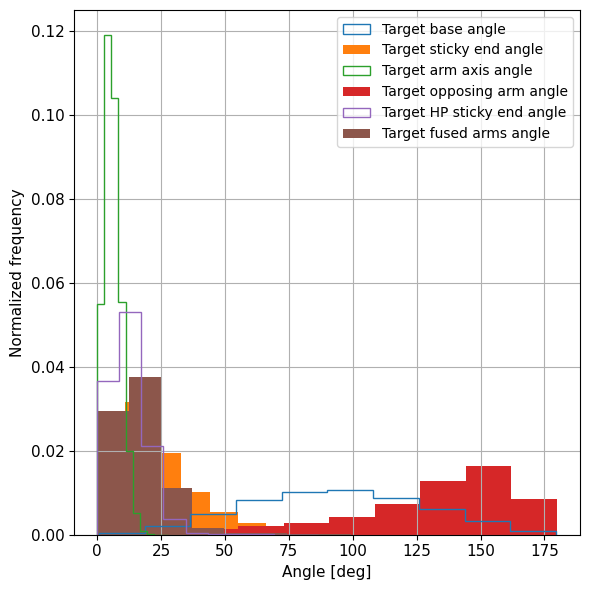

In [22]:
plt.figure(figsize=(6,6))
plt.hist(values_angle_base_target*180/np.pi,density=True,label="Target base angle",histtype="step")
plt.hist(values_angle_link_target*180/np.pi,density=True,label="Target sticky end angle",histtype="bar")
plt.hist(values_angle_arm_axis_target*180/np.pi,density=True,label="Target arm axis angle",histtype="step")
plt.hist(values_angle_oppa_target*180/np.pi,density=True,label="Target opposing arm angle",histtype="bar")
plt.hist(values_angle_link_HP_target*180/np.pi,density=True,label="Target HP sticky end angle",histtype="step")
plt.hist(values_angle_ds_fused_link_target*180/np.pi,density=True,label="Target fused arms angle",histtype="bar")


plt.legend()
plt.xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
plt.ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
plt.xticks(fontname = "Arial",fontsize=11)
plt.yticks(fontname = "Arial",fontsize=11)
plt.grid()
plt.tight_layout()

# Optimize arm axis angle

In [23]:
#use botorch implementation 
#initialize GP model, train on input and predict next params
def apply_gp_bo_1(x_rs,x_train_rs,x,f_train_rs,seed,dim_x,dim_y,num_restarts,raw_samples,scaler_x):
    #x_rs: full rescaled parameter space  -> no actual rescaling needed with internal rescaling by botorch
    #x_train_rs: rescaled training values -> no actual rescaling needed with internal rescaling by botorch
    #x: full non-rescaled parameter space -> only needed to get bounds
    #initialize and train GP model

    #set random seed for torch and numpy, each round gets different seed based on number of rounds
    torch.manual_seed(seed+len(f_train_rs))
    np.random.seed(seed+len(f_train_rs))

    #fit scaler on full range of values
    scaler_x1=scaler_x()
    scaler_x1.fit(x) 
    x=scaler_x1.transform(x)
    #print(x)
    #minimum and maximum values for bounds
    min_bounds = np.min(x, axis=0)
    max_bounds = np.max(x, axis=0)
    bounds = np.vstack((min_bounds, max_bounds))
    #print(bounds)
    bounds = torch.from_numpy(bounds)
    #print(x_train_rs,f_train_rs)

    #x and f as arrays
    x_train_rs=np.array(x_train_rs)
    f_train_rs=np.array(f_train_rs).reshape(-1,1)

    #option to scale input before botorch 
    x_train_rs=scaler_x1.transform(x_train_rs)
    #print(x_train_rs,f_train_rs)

    #x and f as torch tensor
    x_train_rs=torch.from_numpy(x_train_rs)
    f_train_rs=torch.from_numpy(f_train_rs)
    
    #print(x_train_rs.shape,f_train_rs.shape)
    #option to specify noise
    #train_fvar = torch.zeros_like(f_train_rs)  # Zero noise
    #likelihood = FixedNoiseGaussianLikelihood(noise=train_fvar)
    #gp=SingleTaskGP(train_X=x_train_rs,train_Y=f_train_rs,**params_SingleTaskGP_dict)
    gp=SingleTaskGP(train_X=x_train_rs,train_Y=f_train_rs,input_transform=Normalize(d=dim_x),outcome_transform=Standardize(m=dim_y))
    

    mll = ExactMarginalLogLikelihood(gp.likelihood, gp)
    fit_gpytorch_mll(mll)

    logEI = LogExpectedImprovement(model=gp, best_f=f_train_rs.max())
    #ei = ExpectedImprovement(model=gp, best_f=f_train_rs.max())
    ucb =UpperConfidenceBound(gp, beta=1)

    candidate, acq_value = optimize_acqf(ucb, bounds=bounds, q=1, num_restarts=num_restarts, raw_samples=raw_samples)

    x_rs_next=candidate.detach().numpy()[0]
    #print(x_rs_next)
    #apply inverse scaling transform
    if dim_x==1:
        x_next=scaler_x1.inverse_transform(x_rs_next.reshape(-1, 1)).flatten()
    else:
        x_next=scaler_x1.inverse_transform(x_rs_next)
    #x_next=x_rs_next
    print(x_rs_next,x_next)
    gpr=None
    
    return x_next, x_next, gpr




In [24]:
#for GP parameter values need to be in other range, for instance [0,5], apply scaler to parameter lists
def rescaled_params_df(df):
    scalers = []
    scaled_values = []

    for values in df['Param values']:
        scaler = MinMaxScaler(feature_range=(0, 5))
        scaled = scaler.fit_transform(np.asarray(values*10**20).reshape(-1, 1)).flatten()
        scalers.append(scaler)
        scaled_values.append(scaled)

    df['Scalers'] = scalers
    df['Rs param values'] = scaled_values
    
    return df

#generate linearly scaled rs values, independent of actual parameter scaling
def rescaled_params_2_df(df):
    scalers = []
    scaled_values = []

    for values in df['Param values']:
        scaler = MinMaxScaler(feature_range=(0, 5))
        values_lin=np.linspace(0,5,len(values))
        scaled = scaler.fit_transform(values_lin.reshape(-1, 1)).flatten()
        scalers.append(scaler)
        scaled_values.append(scaled)

    df['Scalers'] = scalers
    df['Rs param values'] = scaled_values
    
    return df

#place holder rescaling
def rescaled_params_no_sc_df(df):
    scalers = []
    scaled_values = []

    for values in df['Param values']:
        scaler = FunctionTransformer(func=None) #MinMaxScaler(feature_range=(0, 5))
        scaled = scaler.fit_transform(np.asarray(values).reshape(-1, 1)).flatten()
        scalers.append(scaler)
        scaled_values.append(scaled)

    df['Scalers'] = scalers
    df['Rs param values'] = scaled_values
    
    return df


def scale_by_inverse_min(X):
    min_vals = np.min(X, axis=0)
    return X * (1 / min_vals)

#sklearn scaler struggles with small values, use simple implementaion generated with Copilot
class MinMaxScaler2:
    def __init__(self):
        self.data_min = None
        self.data_max = None

    def fit(self, data):
        """
        Compute the minimum and maximum values for scaling.

        Parameters:
        data (numpy.ndarray): The input data to be scaled.
        """
        self.data_min = np.min(data, axis=0)
        self.data_max = np.max(data, axis=0)

    def transform(self, data):
        """
        Scale the data to the range [0, 1].

        Parameters:
        data (numpy.ndarray): The input data to be scaled.

        Returns:
        numpy.ndarray: The scaled data.
        """
        if self.data_min is None or self.data_max is None:
            raise ValueError("The scaler has not been fitted yet.")
        scaled_data = (data - self.data_min) / (self.data_max - self.data_min)
        return scaled_data

    def inverse_transform(self, scaled_data):
        """
        Reverse the scaling of the data.

        Parameters:
        scaled_data (numpy.ndarray): The scaled data to be reverted.

        Returns:
        numpy.ndarray: The Arial data.
        """
        if self.data_min is None or self.data_max is None:
            raise ValueError("The scaler has not been fitted yet.")
        Original_data = scaled_data * (self.data_max - self.data_min) + self.data_min
        return Original_data
        
#apply MinMaxScaler2 to data
def rescaled_params_df_MinMaxScaler2(df):
    scalers = []
    scaled_values = []

    for values in df['Param values']:
        scaler = MinMaxScaler2()
        scaler.fit(np.asarray(values).reshape(-1, 1))
        scaled = scaler.transform(np.asarray(values).reshape(-1, 1)).flatten()
        scalers.append(scaler)
        scaled_values.append(scaled)

    df['Scalers'] = scalers
    df['Rs param values'] = scaled_values
    
    return df

In [25]:
#copy of sim params
run_sim_1_input_1=run_sim_1_input.copy()

#specify which parameters are to be optimised over which range
var_params_1={"Param names":["k_angle_ds_arm"],
                         
            "Param values":[k_angle_ds_arm_range],
            
            "Set of indep params":[0],
           "Index init guess":[[0,3]] #[1,8]
           }

df_var_params_1=pd.DataFrame(var_params_1)



#placeholder scaler on real values
df_var_params_1 = rescaled_params_no_sc_df(df_var_params_1)


df_var_params_1

,Param names,Param values,Set of indep params,Index init guess,Scalers,Rs param values
0,k_angle_ds_arm,"[1e-24, 1e-22, 1e-20, 1e-18]",0,"[0, 3]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"


In [26]:
#specify evaluation and Bayesian opt parameters for each independent set of parameters
#every independent parameter set needs own dictionaries for GP and eval, as parameters need to be updated independently later


GP_params_1={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":1,"dim_y":1,"num_restarts":100,"raw_samples":1000,"scaler_x":MinMaxScaler2}


Eval_params_1={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
             "arm_axis_angle_distr_target":arm_axis_angle_distr_target}

eval_opt_param_set_1={"Set of indep params":[0],
                      "Eval fct": [eval_sim_1_1_aa],
                      "Eval params":[Eval_params_1],
                      "Scaler": [FunctionTransformer(func=None)],
                      "GP": [apply_gp_bo_1],
                      "GP params": [GP_params_1]}

df_eval_opt_param_set_1=pd.DataFrame(eval_opt_param_set_1)
df_eval_opt_param_set_1

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params
0,0,<function eval_sim_1_1_aa at 0x7fabc7db3550>,"{'folder': None, 'names_sim_repeat': None, 't_...",FunctionTransformer(),<function apply_gp_bo_1 at 0x7fabc7db3d30>,"{'x_rs': [[0]], 'x_train_rs': [[0]], 'x': [[0]..."


In [28]:
%%time
#run optimization
df_t1,gpr_1=run_gp_11(df_run_sim=run_sim_1_input_1,
              df_var_params=df_var_params_1,
              fct_sim=run_sim_1,
              df_eval_opt_param_set=df_eval_opt_param_set_1,
              sim_folder="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/",
              sim_name="sim_aa_opt_1_",
              file_name_sim_params="params_aa_opt_1", 
              sim_repeats=5,
              iterations=1,
              print_sim_config=False,
              load_existing_init_sims=False,
              load_existing_opt_sims=False)

Step  1 / 2  initial simulations


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:31<00:00, 5468.80it/s]


Step  2 / 2  initial simulations


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:32<00:00, 5421.39it/s]


Step  1 / 1  optimization simulations
[0.69999222] [6.99992518e-19]


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:34<00:00, 5316.76it/s]


CPU times: user 18.4 s, sys: 9.39 s, total: 27.8 s
Wall time: 4min 49s


In [29]:
df_t1

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params,Param names in set,f train,f train rs,x train rs,x train
0,0,<function eval_sim_1_1_aa at 0x7fabc7db3550>,{'folder': '/home/xenia/Masterthesis_ReaDDy/Na...,FunctionTransformer(),<function apply_gp_bo_1 at 0x7fabc7db3d30>,"{'x_rs': [[1e-24], [1e-22], [1e-20], [1e-18]],...",[k_angle_ds_arm],"[0.34016077436322417, 0.6379057099449169, 0.69...","[0.34016077436322417, 0.6379057099449169, 0.69...","[[1e-24], [1e-18], [6.99992518478934e-19]]","[[1e-24], [1e-18], [6.99992518478934e-19]]"


In [30]:
#create dictionary with updated parameters
dict_opt_params_step_1={}
dict_opt_rs_params_step_1={}

for index, row in df_t1.iterrows():
    id_max=np.argmax(row["f train"])
    print("max fitness:",id_max,np.max(row["f train"]))
    opt_params_names=row["Param names in set"]
    opt_params_names_rs=[ e+"_rs" for e in opt_params_names]
    opt_params=row["x train"][id_max]
    opt_params_rs=row["x train rs"][id_max]
    
    for key, value in zip(opt_params_names,opt_params):
        dict_opt_params_step_1[key] = value
    for key, value in zip(opt_params_names_rs,opt_params_rs):
        dict_opt_rs_params_step_1[key] = value    
        
    print("param set:",row["Set of indep params"],row["x train rs"][id_max])
    print("param set:",row["Set of indep params"],row["x train"][id_max])

    
print(dict_opt_rs_params_step_1)    
print(dict_opt_params_step_1)

max fitness: 2 0.6996652173699773
param set: 0 [6.99992518478934e-19]
param set: 0 [6.99992518478934e-19]
{'k_angle_ds_arm_rs': 6.99992518478934e-19}
{'k_angle_ds_arm': 6.99992518478934e-19}


Parameter set 0


<Figure size 600x300 with 0 Axes>

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

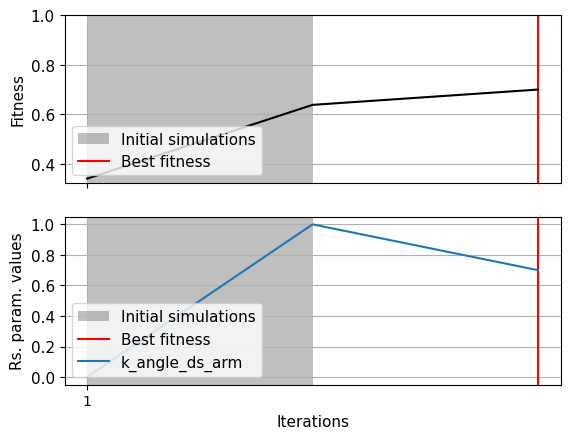

In [31]:
for index, row in df_t1.iterrows():
    fig1=plt.figure(figsize=(6,3))
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
    #ax1 = fig1.add_subplot(111)
    fitness_range_l=0.4
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=5
    init_sim_range=2
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.linspace(fitness_range_l,fitness_range_h,fitness_range_step)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontname = "Arial",fontsize=11)
    #ax1.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontname = "Arial",fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontname= "Arial",fontsize=11)
    ax1.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax1.grid()
    
    
    #for j in range(len(row["x train"][0])):
      #  param_name=row["Param names in set"][j]
       # ax2.errorbar(iterations_l,[sublist[j] for sublist in row["x train"]],label=param_name)
    for j in range(len(row["x train rs"][0])):
        param_name=row["Param names in set"][j]
        param_sel=[sublist[j] for sublist in row["x train rs"]]
        scaler_param_sel=MinMaxScaler2()
        param_sel_range=df_var_params_1[df_var_params_1["Param names"]==param_name]["Param values"].to_numpy()[0]
        scaler_param_sel.fit(param_sel_range)
        param_sel_rs=scaler_param_sel.transform(param_sel)
        ax2.errorbar(iterations_l,param_sel_rs,label=param_name)
        
    ax2.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax2.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax2.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax2.set_ylabel("Rs. param. values",fontname = "Arial",fontsize=11)
    ax2.set_yticks(param_value_range,param_value_range,fontname = "Arial",fontsize=11)
    #ax2.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.1f'))
    ax2.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax2.grid()
    plt.show()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


Base angle


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


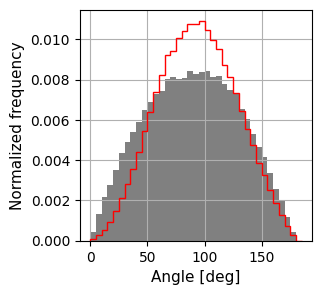

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


Link angle


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


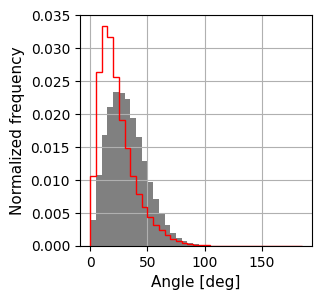

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


Arm axis angle


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


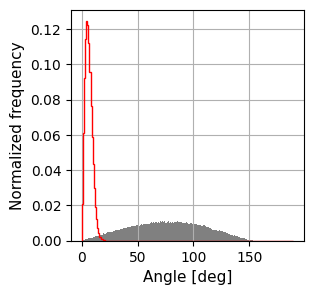

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


Opposing arm angle


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


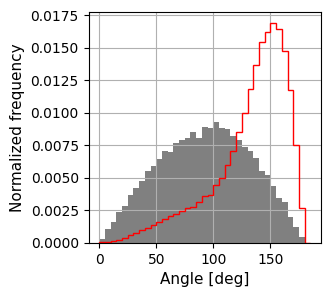

###########################
###########################
###########################


Process Process-73:
Traceback (most recent call last):
  File "/home/xenia/miniconda3/envs/readdy2/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/home/xenia/miniconda3/envs/readdy2/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
Process Process-74:
Process Process-75:
Traceback (most recent call last):
  File "/home/xenia/Masterthesis_ReaDDy/Code_Bayes_opt_nanomotifs/python_scripts/NCG_Bay_opt_readdy_sim.py", line 417, in get_training_angle_distr_7
    traj=readdy.Trajectory(input_name)
  File "/home/xenia/miniconda3/envs/readdy2/lib/python3.9/site-packages/readdy/api/trajectory.py", line 231, in __init__
    assert _os.path.exists(filename), "The file '{}' did not exist!".format(filename)
  File "/home/xenia/miniconda3/envs/readdy2/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
AssertionError: The file '/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coars

KeyError: 'sim_aa_opt_1_91.h5'

In [33]:
%%time

folder_names_angle_eval="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/"

names_ini1="sim_aa_opt_1_"
names_angle_eval=[[names_ini1+str(l+1)+".h5" for l in range(5)],[names_ini1+str(l+91)+".h5" for l in range(5)]]

names_angles=["Base angle", "Link angle","Arm axis angle","Opposing arm angle"]
for i in range(len(names_angle_eval)):
    n1,n2,n3,n4,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_1_4_ba_aa_oa_la(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]
    
    for j in range(len(list_angles_eval)):
        fig1=plt.figure(figsize=(3,3))
        ax1 = fig1.add_subplot(111)
        if names_angles[j]=="Arm axis angle":
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='bar',color="grey")[0]
            #plt.xlim(-1,20)
        else:
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
        print(names_angles[j])
        ax1.set_ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
        ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
        ax1.grid()
        plt.show()
    print("###########################")
    print("###########################")
    print("###########################")


# Optimize base angle, oppa angle, sticky end angle

Parameter set 0: k_angle_ds_base,theta_base_x,k_angle_ds_oppa,theta_oppa_x

Parameter set 1: k_angle_ss_link

In [34]:
#copy of sim params
run_sim_1_input_2=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_2.update(dict_opt_params_step_1)

#specify which parameters are to be optimised over which range
var_params_2={"Param names":["k_angle_ds_base",
                          "k_angle_ds_oppa",
                          "k_angle_ss_link",
                          "theta_base_x",
                          "theta_oppa_x"],
                         
            "Param values":[k_angle_ds_base_range,
                           k_angle_ds_oppa_range,
                           k_angle_ss_link_range,
                           theta_base_x_range,
                           theta_oppa_x_range],
            
            "Set of indep params":[0,
                                 0,
                                 1,
                                 0,
                                 0],
           "Index init guess":[[0,0,3,3,0,0,3,3,0,0,3,3,0,0,3,3],
                               [0,3,0,3,0,3,0,3,0,3,0,3,0,3,0,3],
                               [0,3,0,3,0,3,0,3,0,3,0,3,0,3,0,3],
                               [0,0,0,0,3,3,3,3,0,0,0,0,3,3,3,3],
                               [0,0,0,0,0,0,0,0,3,3,3,3,3,3,3,3],
                              ]
           }

'''[1,1,8,8,1,1,8,8,1,1,8,8,1,1,8,8],
                               [1,8,1,8,1,8,1,8,1,8,1,8,1,8,1,8],
                               [1,8,1,8,1,8,1,8,1,8,1,8,1,8,1,8],
                               [1,1,1,1,8,8,8,8,1,1,1,1,8,8,8,8],
                               [1,1,1,1,1,1,1,1,8,8,8,8,8,8,8,8],
                              ]'''

df_var_params_2=pd.DataFrame(var_params_2)



#Std scaler on real values
#df_var_params_2 = rescaled_params_df(df_var_params_2)

#placeholder scaler on real values
df_var_params_2 = rescaled_params_no_sc_df(df_var_params_2)


df_var_params_2

,Param names,Param values,Set of indep params,Index init guess,Scalers,Rs param values
0,k_angle_ds_base,"[1e-24, 1e-22, 1e-20, 1e-18]",0,"[0, 0, 3, 3, 0, 0, 3, 3, 0, 0, 3, 3, 0, 0, 3, 3]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"
1,k_angle_ds_oppa,"[1e-24, 1e-22, 1e-20, 1e-18]",0,"[0, 3, 0, 3, 0, 3, 0, 3, 0, 3, 0, 3, 0, 3, 0, 3]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"
2,k_angle_ss_link,"[1e-24, 1e-22, 1e-20, 1e-18]",1,"[0, 3, 0, 3, 0, 3, 0, 3, 0, 3, 0, 3, 0, 3, 0, 3]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"
3,theta_base_x,"[1.3089969389957472, 1.5707963267948966, 1.832...",0,"[0, 0, 0, 0, 3, 3, 3, 3, 0, 0, 0, 0, 3, 3, 3, 3]",FunctionTransformer(),"[1.3089969389957472, 1.5707963267948966, 1.832..."
4,theta_oppa_x,"[2.356194490192345, 2.6179938779914944, 2.8797...",0,"[0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 3, 3, 3, 3, 3, 3]",FunctionTransformer(),"[2.356194490192345, 2.6179938779914944, 2.8797..."


In [35]:
#specify evaluation and Bayesian opt parameters for each independent set of parameters
#every independent parameter set needs own dictionaries for GP and eval, as parameters need to be updated independently later
GP_params_2_0={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":4,"dim_y":1,"num_restarts":1000,"raw_samples":10000,"scaler_x":MinMaxScaler2}
GP_params_2_1={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":1,"dim_y":1,"num_restarts":1000,"raw_samples":10000,"scaler_x":MinMaxScaler2}


Eval_params_2_0={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
             "base_angle_distr_target":base_angle_distr_target,
             "oppa_angle_distr_target":oppa_angle_distr_target}

Eval_params_2_1={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
             "link_angle_distr_target":link_angle_distr_target}

eval_opt_param_set_2={"Set of indep params":[0,
                                             1],
                      "Eval fct": [eval_sim_1_2_ba_oa,
                                   eval_sim_1_1_la],
                      "Eval params":[Eval_params_2_0,
                                     Eval_params_2_1],
                      "Scaler": [FunctionTransformer(func=None),
                                 FunctionTransformer(func=None)],
                      "GP": [apply_gp_bo_1,
                             apply_gp_bo_1],
                      "GP params": [GP_params_2_0,
                                    GP_params_2_1]}

df_eval_opt_param_set_2=pd.DataFrame(eval_opt_param_set_2)
df_eval_opt_param_set_2

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params
0,0,<function eval_sim_1_2_ba_oa at 0x7fabc7db3430>,"{'folder': None, 'names_sim_repeat': None, 't_...",FunctionTransformer(),<function apply_gp_bo_1 at 0x7fabc7db3d30>,"{'x_rs': [[0]], 'x_train_rs': [[0]], 'x': [[0]..."
1,1,<function eval_sim_1_1_la at 0x7fabc7db34c0>,"{'folder': None, 'names_sim_repeat': None, 't_...",FunctionTransformer(),<function apply_gp_bo_1 at 0x7fabc7db3d30>,"{'x_rs': [[0]], 'x_train_rs': [[0]], 'x': [[0]..."


In [40]:
%%time
#run optimization
df_t2,gpr_2=run_gp_11(df_run_sim=run_sim_1_input_2,
              df_var_params=df_var_params_2,
              fct_sim=run_sim_1,
              df_eval_opt_param_set=df_eval_opt_param_set_2,
              sim_folder="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/",
              sim_name="sim_ba_oa_la_opt_1_",
              file_name_sim_params=None, #"params_ba_oa_la_opt_1", 
              sim_repeats=5,
              iterations=10,
              print_sim_config=False,
              load_existing_init_sims=False,
              load_existing_opt_sims=False)

Step  1 / 16  initial simulations


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:36<00:00, 5168.46it/s]


Step  2 / 16  initial simulations


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:36<00:00, 5164.97it/s]


Step  3 / 16  initial simulations


  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

Step  4 / 16  initial simulations


  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

Step  5 / 16  initial simulations


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:32<00:00, 5424.54it/s]


Step  6 / 16  initial simulations


  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

Step  7 / 16  initial simulations


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:35<00:00, 5214.24it/s]


Step  8 / 16  initial simulations


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:34<00:00, 5276.88it/s]


Step  9 / 16  initial simulations


  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

Step  10 / 16  initial simulations


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:34<00:00, 5315.73it/s]


Step  11 / 16  initial simulations


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:33<00:00, 5336.68it/s]


Step  12 / 16  initial simulations


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:33<00:00, 5351.92it/s]


Step  13 / 16  initial simulations


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:32<00:00, 5398.61it/s]


Step  14 / 16  initial simulations


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:31<00:00, 5440.39it/s]


Step  15 / 16  initial simulations


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:31<00:00, 5461.95it/s]


Step  16 / 16  initial simulations


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:31<00:00, 5481.13it/s]


Step  1 / 10  optimization simulations
[0.         0.03972572 0.50704676 0.47310735] [1.00000000e-24 3.97266796e-20 1.70723053e+00 2.72777213e+00]
[0.46872161] [4.68722142e-19]


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:32<00:00, 5379.21it/s]


Step  2 / 10  optimization simulations
[0.07627457 0.         0.50641146 0.4788035 ] [7.62754919e-20 1.00000000e-24 1.70673157e+00 2.73224588e+00]
[0.42203385] [4.22034429e-19]


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:32<00:00, 5410.33it/s]


Step  3 / 10  optimization simulations
[0.         0.18535377 0.50223261 0.41006106] [1.00000000e-24 1.85354582e-19 1.70344951e+00 2.67825569e+00]
[0.44192967] [4.41930229e-19]


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:38<00:00, 5054.94it/s]


Step  4 / 10  optimization simulations
[0.         0.         0.50722797 0.48565264] [1.00000000e-24 1.00000000e-24 1.70737286e+00 2.73762518e+00]
[0.43654626] [4.36546828e-19]


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:31<00:00, 5477.62it/s]


Step  5 / 10  optimization simulations
[0.         0.04435641 0.59857451 0.56997706] [1.00000000e-24 4.43573678e-20 1.77911626e+00 2.80385343e+00]


  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

[0.51322058] [5.1322107e-19]


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:31<00:00, 5451.15it/s]


Step  6 / 10  optimization simulations
[0.         0.         0.42653197 0.28350682] [1.00000000e-24 1.00000000e-24 1.64399436e+00 2.57886022e+00]
[0.33532457] [3.35325235e-19]


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:31<00:00, 5448.38it/s]


Step  7 / 10  optimization simulations
[0.         0.         0.56193891 0.85204203] [1.00000000e-24 1.00000000e-24 1.75034272e+00 3.02538673e+00]
[0.30330623] [3.0330693e-19]


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:33<00:00, 5375.48it/s]


Step  8 / 10  optimization simulations
[0.         0.         0.98046584 0.50426878] [1.00000000e-24 1.00000000e-24 2.07905301e+00 2.75224626e+00]
[0.25726489] [2.57265637e-19]


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:36<00:00, 5208.27it/s]


Step  9 / 10  optimization simulations
[0.         0.         0.10470312 0.50224306] [1.00000000e-24 1.00000000e-24 1.39123058e+00 2.75065527e+00]
[0.22956439] [2.29565158e-19]


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:32<00:00, 5382.14it/s]


Step  10 / 10  optimization simulations
[0.         0.         0.59527846 0.46323158] [1.00000000e-24 1.00000000e-24 1.77652755e+00 2.72001572e+00]


  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

[0.21380196] [2.13802746e-19]


100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:19<00:00, 6313.11it/s]


CPU times: user 5min 3s, sys: 1min 29s, total: 6min 32s
Wall time: 44min 16s


In [41]:
df_t2

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params,Param names in set,f train,f train rs,x train rs,x train
0,0,<function eval_sim_1_2_ba_oa at 0x7fabc7db3430>,{'folder': '/home/xenia/Masterthesis_ReaDDy/Na...,FunctionTransformer(),<function apply_gp_bo_1 at 0x7fabc7db3d30>,"{'x_rs': [[1e-24, 1e-24, 1.3089969389957472, 2...","[k_angle_ds_base, k_angle_ds_oppa, theta_base_...","[0.8315566767918005, 0.7666281233306236, 0.705...","[0.8315566767918005, 0.7666281233306236, 0.705...","[[1e-24, 1e-24, 1.3089969389957472, 2.35619449...","[[1e-24, 1e-24, 1.3089969389957472, 2.35619449..."
1,1,<function eval_sim_1_1_la at 0x7fabc7db34c0>,{'folder': '/home/xenia/Masterthesis_ReaDDy/Na...,FunctionTransformer(),<function apply_gp_bo_1 at 0x7fabc7db3d30>,"{'x_rs': [[1e-24], [1e-22], [1e-20], [1e-18]],...",[k_angle_ss_link],"[0.7724371483751996, 0.7633270930164777, 0.772...","[0.7724371483751996, 0.7633270930164777, 0.772...","[[1e-24], [1e-18], [1e-24], [1e-18], [1e-24], ...","[[1e-24], [1e-18], [1e-24], [1e-18], [1e-24], ..."


In [42]:
#create dictionary with updated parameters
dict_opt_params_step_2={}
dict_opt_rs_params_step_2={}

for index, row in df_t2.iterrows():
    id_max=np.argmax(row["f train"])
    print("max fitness:",id_max,np.max(row["f train"]))
    opt_params_names=row["Param names in set"]
    opt_params_names_rs=[ e+"_rs" for e in opt_params_names]
    opt_params=row["x train"][id_max]
    opt_params_rs=row["x train rs"][id_max]
    
    for key, value in zip(opt_params_names,opt_params):
        dict_opt_params_step_2[key] = value
    for key, value in zip(opt_params_names_rs,opt_params_rs):
        dict_opt_rs_params_step_2[key] = value    
        
    print("param set:",row["Set of indep params"],row["x train rs"][id_max])
    print("param set:",row["Set of indep params"],row["x train"][id_max])

    
print(dict_opt_rs_params_step_2)    
print(dict_opt_params_step_2)

max fitness: 16 0.8663035763370512
param set: 0 [1e-24, 3.9726679590017466e-20, 1.7072305342943406, 2.7277721310566325]
param set: 0 [1e-24, 3.9726679590017466e-20, 1.7072305342943406, 2.7277721310566325]
max fitness: 25 0.8065421749314811
param set: 1 [2.1380274552242295e-19]
param set: 1 [2.1380274552242295e-19]
{'k_angle_ds_base_rs': 1e-24, 'k_angle_ds_oppa_rs': 3.9726679590017466e-20, 'theta_base_x_rs': 1.7072305342943406, 'theta_oppa_x_rs': 2.7277721310566325, 'k_angle_ss_link_rs': 2.1380274552242295e-19}
{'k_angle_ds_base': 1e-24, 'k_angle_ds_oppa': 3.9726679590017466e-20, 'theta_base_x': 1.7072305342943406, 'theta_oppa_x': 2.7277721310566325, 'k_angle_ss_link': 2.1380274552242295e-19}


Parameter set 0


<Figure size 600x300 with 0 Axes>

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

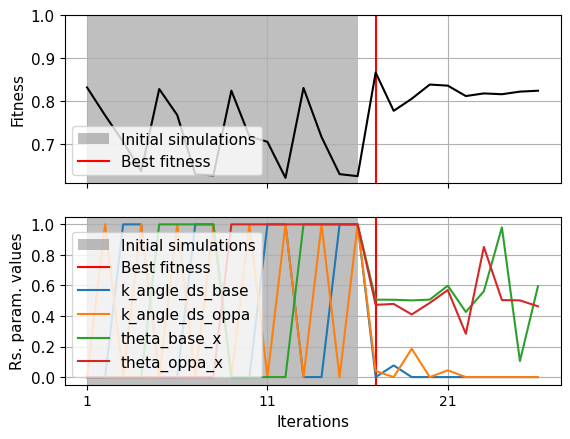

Parameter set 1


<Figure size 600x300 with 0 Axes>

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

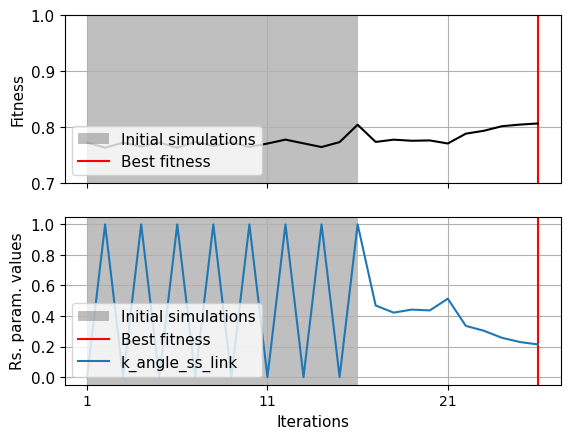

In [43]:
for index, row in df_t2.iterrows():
    fig1=plt.figure(figsize=(6,3))
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
    #ax1 = fig1.add_subplot(111)
    fitness_range_l=0.7
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=10
    init_sim_range=16
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1)
    fitnes_range=np.round(np.linspace(fitness_range_l,fitness_range_h,fitness_range_step),1)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontname = "Arial",fontsize=11)
    #ax1.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontname = "Arial",fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontname= "Arial",fontsize=11)
    ax1.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax1.grid()
    
    
    #for j in range(len(row["x train rs"][0])):
       # param_name=row["Param names in set"][j]
       # ax2.errorbar(iterations_l,[sublist[j] for sublist in row["x train rs"]],label=param_name)

    for j in range(len(row["x train rs"][0])):
        param_name=row["Param names in set"][j]
        param_sel=[sublist[j] for sublist in row["x train rs"]]
        scaler_param_sel=MinMaxScaler2()
        param_sel_range=df_var_params_2[df_var_params_2["Param names"]==param_name]["Param values"].to_numpy()[0]
        scaler_param_sel.fit(param_sel_range)
        param_sel_rs=scaler_param_sel.transform(param_sel)
        ax2.errorbar(iterations_l,param_sel_rs,label=param_name)
        
    ax2.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax2.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax2.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax2.set_ylabel("Rs. param. values",fontname = "Arial",fontsize=11)
    #plt.ylim(10**-22,0.1*10**-18)
    ax2.set_yticks(param_value_range,param_value_range,fontname = "Arial",fontsize=11)
    #ax2.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.1f'))
    ax2.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax2.grid()
    plt.show()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


Base angle


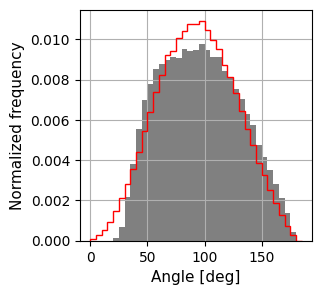

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


Link angle


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


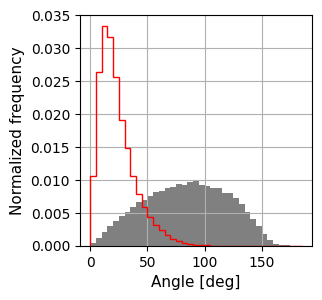

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


Arm axis angle


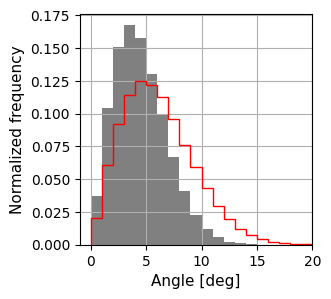

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


Opposing arm angle


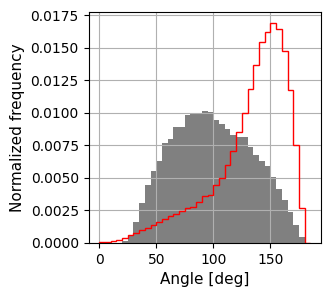

###########################
###########################
###########################


Process Process-731:
Traceback (most recent call last):
  File "/home/xenia/miniconda3/envs/readdy2/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/home/xenia/miniconda3/envs/readdy2/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
Process Process-732:
  File "/home/xenia/Masterthesis_ReaDDy/Code_Bayes_opt_nanomotifs/python_scripts/NCG_Bay_opt_readdy_sim.py", line 417, in get_training_angle_distr_7
    traj=readdy.Trajectory(input_name)
Traceback (most recent call last):
  File "/home/xenia/miniconda3/envs/readdy2/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/home/xenia/miniconda3/envs/readdy2/lib/python3.9/site-packages/readdy/api/trajectory.py", line 231, in __init__
    assert _os.path.exists(filename), "The file '{}' did not exist!".format(filename)
  File "/home/xenia/miniconda3/envs/readdy2/lib/python3.9/multiprocessing/process.py", line

KeyError: 'sim_ba_oa_la_opt_1_646.h5'

In [45]:
%%time

folder_names_angle_eval="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/"

names_ini1="sim_ba_oa_la_opt_1_"
names_angle_eval=[[names_ini1+str(l+1)+".h5" for l in range(5)],[names_ini1+str(l+646)+".h5" for l in range(5)]] #96

names_angles=["Base angle", "Link angle","Arm axis angle","Opposing arm angle"]
for i in range(len(names_angle_eval)):
    n1,n2,n3,n4,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_1_4_ba_aa_oa_la(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]
    
    for j in range(len(list_angles_eval)):
        fig1=plt.figure(figsize=(3,3))
        ax1 = fig1.add_subplot(111)
        if names_angles[j]=="Arm axis angle":
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='bar',color="grey")[0]
            plt.xlim(-1,20)
        else:
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
        print(names_angles[j])
        ax1.set_ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
        ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
        ax1.grid()
        plt.show()
    print("###########################")
    print("###########################")
    print("###########################")


# Optimize HP sticky ends

In [28]:
#copy of sim params
run_sim_1_input_3=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_3.update(dict_opt_params_step_1)
run_sim_1_input_3.update(dict_opt_params_step_2)

#need HP template
run_sim_1_input_3["use_x_1_HP_template"]=True

#specify which parameters are to be optimised over which range
var_params_3={"Param names":["k_angle_ds_hp"],
                         
            "Param values":[k_angle_ds_hp_range],
            
            "Set of indep params":[0],
           "Index init guess":[[0,3]]  #[1,8]
           }

df_var_params_3=pd.DataFrame(var_params_3)


#Std scaler on real values
#df_var_params_3 = rescaled_params_df(df_var_params_3)

#placeholder scaler on real values
df_var_params_3 = rescaled_params_no_sc_df(df_var_params_3)


df_var_params_3

,Param names,Param values,Set of indep params,Index init guess,Scalers,Rs param values
0,k_angle_ds_hp,"[1e-24, 1e-22, 1e-20, 1e-18]",0,"[0, 3]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"


In [29]:
#specify evaluation and Bayesian opt parameters for each independent set of parameters
#every independent parameter set needs own dictionaries for GP and eval, as parameters need to be updated independently later
GP_params_3={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":1,"dim_y":1,"num_restarts":100,"raw_samples":1000,"scaler_x":MinMaxScaler2}


Eval_params_3={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
             "link_HP_angle_distr_target":link_HP_angle_distr_target}

eval_opt_param_set_3={"Set of indep params":[0],
                      "Eval fct": [eval_sim_1_1_hp],
                      "Eval params":[Eval_params_3],
                      "Scaler": [StandardScaler()],
                      "GP": [apply_gp_bo_1],
                      "GP params": [GP_params_3]}

df_eval_opt_param_set_3=pd.DataFrame(eval_opt_param_set_3)
df_eval_opt_param_set_3

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params
0,0,<function eval_sim_1_1_hp at 0x7ff785712d30>,"{'folder': None, 'names_sim_repeat': None, 't_...",StandardScaler(),<function apply_gp_bo_1 at 0x7ff939ac6af0>,"{'x_rs': [[0]], 'x_train_rs': [[0]], 'x': [[0]..."


In [30]:
#run optimization
df_t3,gpr_3=run_gp_11(df_run_sim=run_sim_1_input_3,
              df_var_params=df_var_params_3,
              fct_sim=run_sim_1,
              df_eval_opt_param_set=df_eval_opt_param_set_3,
              sim_folder="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/hp_opt_2/",
              sim_name="sim_hp_opt_1_",
              file_name_sim_params=None, #"params_hp_opt_1", 
              sim_repeats=5,
              iterations=30,
              print_sim_config=False,
              load_existing_init_sims=True,
              load_existing_opt_sims=True)

Step  1 / 2  initial simulations
Step  2 / 2  initial simulations
Step  1 / 30  optimization simulations
[0.69999222] [6.99992519e-19]
Step  2 / 30  optimization simulations
[0.84215178] [8.42151941e-19]
Step  3 / 30  optimization simulations
[0.61196779] [6.11968174e-19]
Step  4 / 30  optimization simulations
[0.52598815] [5.25988627e-19]
Step  5 / 30  optimization simulations
[0.45169056] [4.51691104e-19]
Step  6 / 30  optimization simulations
[0.38472107] [3.8472169e-19]
Step  7 / 30  optimization simulations
[0.32358948] [3.23590161e-19]
Step  8 / 30  optimization simulations
[0.27139464] [2.71395369e-19]
Step  9 / 30  optimization simulations
[0.22865648] [2.28657251e-19]
Step  10 / 30  optimization simulations
[0.19374533] [1.93746132e-19]
Step  11 / 30  optimization simulations
[0.16989011] [1.69890941e-19]
Step  12 / 30  optimization simulations
[0.14399285] [1.43993708e-19]
Step  13 / 30  optimization simulations
[0.12636849] [1.26369365e-19]
Step  14 / 30  optimization simula

In [49]:
#create dictionary with updated parameters
dict_opt_params_step_3={}
dict_opt_rs_params_step_3={}

for index, row in df_t3.iterrows():
    id_max=np.argmax(row["f train"])
    print("max fitness:",id_max,np.max(row["f train"]))
    opt_params_names=row["Param names in set"]
    opt_params_names_rs=[ e+"_rs" for e in opt_params_names]
    opt_params=row["x train"][id_max]
    opt_params_rs=row["x train rs"][id_max]
    
    for key, value in zip(opt_params_names,opt_params):
        dict_opt_params_step_3[key] = value
    for key, value in zip(opt_params_names_rs,opt_params_rs):
        dict_opt_rs_params_step_3[key] = value    
        
    print("param set:",row["Set of indep params"],row["x train rs"][id_max])
    print("param set:",row["Set of indep params"],row["x train"][id_max])

    
print(dict_opt_rs_params_step_3)    
print(dict_opt_params_step_3)

NameError: name 'df_t3' is not defined

Parameter set 0


<Figure size 600x300 with 0 Axes>

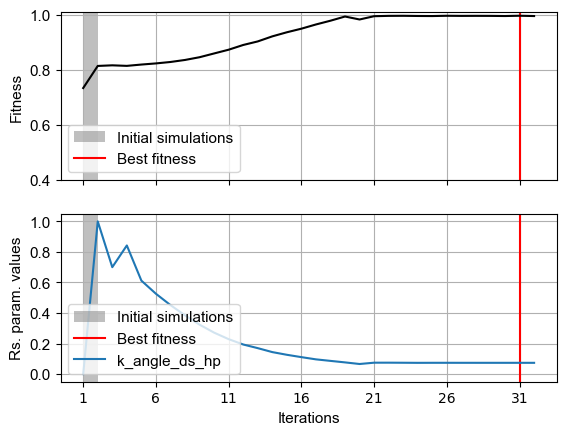

In [32]:
for index, row in df_t3.iterrows():
    fig1=plt.figure(figsize=(6,3))
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
    #ax1 = fig1.add_subplot(111)
    fitness_range_l=0.4
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=5
    init_sim_range=2
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.linspace(fitness_range_l,fitness_range_h,fitness_range_step)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontname = "Arial",fontsize=11)
    #ax1.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontname = "Arial",fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontname= "Arial",fontsize=11)
    ax1.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax1.grid()
    
    
    #for j in range(len(row["x train"][0])):
      #  param_name=row["Param names in set"][j]
       # ax2.errorbar(iterations_l,[sublist[j] for sublist in row["x train"]],label=param_name)
    for j in range(len(row["x train rs"][0])):
        param_name=row["Param names in set"][j]
        param_sel=[sublist[j] for sublist in row["x train rs"]]
        scaler_param_sel=MinMaxScaler2()
        param_sel_range=df_var_params_3[df_var_params_3["Param names"]==param_name]["Param values"].to_numpy()[0]
        scaler_param_sel.fit(param_sel_range)
        param_sel_rs=scaler_param_sel.transform(param_sel)
        ax2.errorbar(iterations_l,param_sel_rs,label=param_name)
        
    ax2.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax2.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax2.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax2.set_ylabel("Rs. param. values",fontname = "Arial",fontsize=11)
    ax2.set_yticks(param_value_range,param_value_range,fontname = "Arial",fontsize=11)
    #ax2.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.1f'))
    ax2.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax2.grid()
    plt.show()

Link HP angle


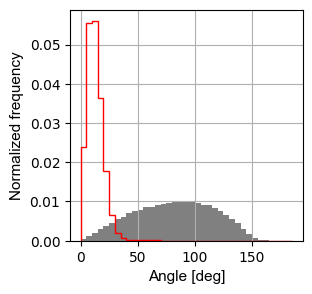

###########################
###########################
###########################
Link HP angle


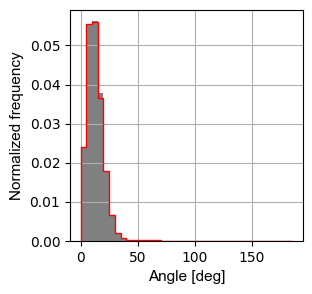

###########################
###########################
###########################
CPU times: user 167 ms, sys: 120 ms, total: 286 ms
Wall time: 1.5 s


In [33]:
%%time

folder_names_angle_eval="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/hp_opt_2/"

names_ini1="sim_hp_opt_1_"
names_angle_eval=[[names_ini1+str(l+1)+".h5" for l in range(5)],[names_ini1+str(l+151)+".h5" for l in range(5)]]

names_angles="Link HP angle"
for i in range(len(names_angle_eval)):
    link_angle_distr_ex_1, values_angle_link_ex1=cg_angle_distr_1_1_hp(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    
    fig1=plt.figure(figsize=(3,3))
    ax1 = fig1.add_subplot(111)

    sel_target_angle_distr=ax1.hist(list_values_target_angles_1[4]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
    sel_angle_distr=ax1.hist(values_angle_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
    print(names_angles)
    ax1.set_ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
    ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
    ax1.grid()
    plt.show()
    print("###########################")
    print("###########################")
    print("###########################")


# Optimize angle between bound arms

In [34]:
#copy of sim params
run_sim_1_input_4=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_4.update(dict_opt_params_step_1)
run_sim_1_input_4.update(dict_opt_params_step_2)
run_sim_1_input_4.update(dict_opt_params_step_3)

#load state with two fused motifs
run_sim_1_input_4["checkpoint_path"]="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/two_fused_motifs_checkpoint/"

#specify which parameters are to be optimised over which range
var_params_4={"Param names":["k_angle_ds_fused_link"],
                         
            "Param values":[k_angle_ds_fused_link_range],
            
            "Set of indep params":[0],
           "Index init guess":[[0,3]] #[1,8]
           }


df_var_params_4=pd.DataFrame(var_params_4)


#Std scaler on real values
#df_var_params_4 = rescaled_params_df(df_var_params_4)

#Std scaler on placeholder linearly scaled values
#df_var_params_4 = rescaled_params_2_df(df_var_params_4)

#placeholder scaler on real values
df_var_params_4 = rescaled_params_no_sc_df(df_var_params_4)

df_var_params_4

,Param names,Param values,Set of indep params,Index init guess,Scalers,Rs param values
0,k_angle_ds_fused_link,"[1e-24, 1e-22, 1e-20, 1e-18]",0,"[0, 3]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"


In [35]:
#specify evaluation and Bayesian opt parameters for each independent set of parameters
#every independent parameter set needs own dictionaries for GP and eval, as parameters need to be updated independently later
GP_params_4={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":1,"dim_y":1,"num_restarts":100,"raw_samples":1000,"scaler_x":MinMaxScaler2}


Eval_params_4={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
             "angle_ds_fused_link_distr_target":angle_ds_fused_link_distr_target}

eval_opt_param_set_4={"Set of indep params":[0],
                      "Eval fct": [eval_sim_1_1_bm],
                      "Eval params":[Eval_params_4],
                      "Scaler": [StandardScaler()],
                      "GP": [apply_gp_bo_1],
                      "GP params": [GP_params_4]}

df_eval_opt_param_set_4=pd.DataFrame(eval_opt_param_set_4)
df_eval_opt_param_set_4

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params
0,0,<function eval_sim_1_1_bm at 0x7ff785712dc0>,"{'folder': None, 'names_sim_repeat': None, 't_...",StandardScaler(),<function apply_gp_bo_1 at 0x7ff939ac6af0>,"{'x_rs': [[0]], 'x_train_rs': [[0]], 'x': [[0]..."


In [36]:
#run optimization
df_t4,gpr_4=run_gp_11(df_run_sim=run_sim_1_input_4,
              df_var_params=df_var_params_4,
              fct_sim=run_sim_1,
              df_eval_opt_param_set=df_eval_opt_param_set_4,
              sim_folder="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/bm_opt_2/",
              sim_name="sim_bm_opt_1_",
              file_name_sim_params=None, #"params_bm_opt_1", 
              sim_repeats=5,
              iterations=30,
              print_sim_config=False,
              load_existing_init_sims=True,
              load_existing_opt_sims=True)

Step  1 / 2  initial simulations
Step  2 / 2  initial simulations
Step  1 / 30  optimization simulations
[0.69999222] [6.99992519e-19]
Step  2 / 30  optimization simulations
[0.79951319] [7.9951339e-19]
Step  3 / 30  optimization simulations
[0.56160077] [5.61601205e-19]
Step  4 / 30  optimization simulations
[0.45229733] [4.52297875e-19]
Step  5 / 30  optimization simulations
[0.36075182] [3.60752461e-19]
Step  6 / 30  optimization simulations
[0.29103353] [2.91034243e-19]
Step  7 / 30  optimization simulations
[0.24110836] [2.41109122e-19]
Step  8 / 30  optimization simulations
[0.20042908] [2.00429879e-19]
Step  9 / 30  optimization simulations
[0.17052472] [1.70525546e-19]
Step  10 / 30  optimization simulations
[0.14600083] [1.46001682e-19]
Step  11 / 30  optimization simulations
[0.1273201] [1.27320974e-19]
Step  12 / 30  optimization simulations
[0.11460759] [1.14608476e-19]
Step  13 / 30  optimization simulations
[0.10295922] [1.02960116e-19]
Step  14 / 30  optimization simulat

In [37]:
#create dictionary with updated parameters
dict_opt_params_step_4={}
dict_opt_rs_params_step_4={}

for index, row in df_t4.iterrows():
    id_max=np.argmax(row["f train"])
    print("max fitness:",id_max,np.max(row["f train"]))
    opt_params_names=row["Param names in set"]
    opt_params_names_rs=[ e+"_rs" for e in opt_params_names]
    opt_params=row["x train"][id_max]
    opt_params_rs=row["x train rs"][id_max]
    
    for key, value in zip(opt_params_names,opt_params):
        dict_opt_params_step_4[key] = value
    for key, value in zip(opt_params_names_rs,opt_params_rs):
        dict_opt_rs_params_step_4[key] = value    
        
    print("param set:",row["Set of indep params"],row["x train rs"][id_max])
    print("param set:",row["Set of indep params"],row["x train"][id_max])

    
print(dict_opt_rs_params_step_4)    
print(dict_opt_params_step_4)

max fitness: 24 0.9927440860581276
param set: 0 [3.902461702743214e-20]
param set: 0 [3.902461702743214e-20]
{'k_angle_ds_fused_link_rs': 3.902461702743214e-20}
{'k_angle_ds_fused_link': 3.902461702743214e-20}


Parameter set 0


<Figure size 600x300 with 0 Axes>

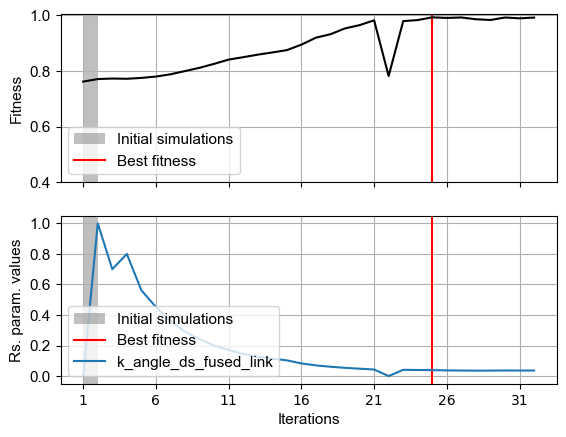

In [38]:
for index, row in df_t4.iterrows():
    fig1=plt.figure(figsize=(6,3))
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
    #ax1 = fig1.add_subplot(111)
    fitness_range_l=0.4
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=5
    init_sim_range=2
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.linspace(fitness_range_l,fitness_range_h,fitness_range_step)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontname = "Arial",fontsize=11)
    #ax1.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontname = "Arial",fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontname= "Arial",fontsize=11)
    ax1.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax1.grid()
    
    
    #for j in range(len(row["x train"][0])):
      #  param_name=row["Param names in set"][j]
       # ax2.errorbar(iterations_l,[sublist[j] for sublist in row["x train"]],label=param_name)
    for j in range(len(row["x train rs"][0])):
        param_name=row["Param names in set"][j]
        param_sel=[sublist[j] for sublist in row["x train rs"]]
        scaler_param_sel=MinMaxScaler2()
        param_sel_range=df_var_params_4[df_var_params_4["Param names"]==param_name]["Param values"].to_numpy()[0]
        scaler_param_sel.fit(param_sel_range)
        param_sel_rs=scaler_param_sel.transform(param_sel)
        ax2.errorbar(iterations_l,param_sel_rs,label=param_name)
        
    ax2.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax2.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax2.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax2.set_ylabel("Rs. param. values",fontname = "Arial",fontsize=11)
    ax2.set_yticks(param_value_range,param_value_range,fontname = "Arial",fontsize=11)
    #ax2.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.1f'))
    ax2.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax2.grid()
    plt.show()

Bound motifs angle


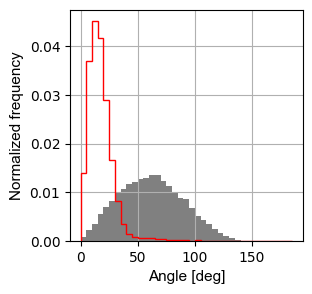

###########################
###########################
###########################
Bound motifs angle


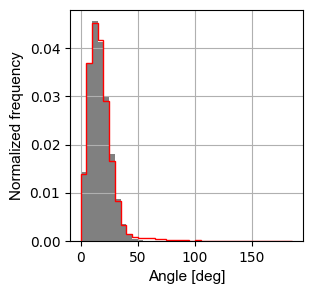

###########################
###########################
###########################
CPU times: user 135 ms, sys: 79.9 ms, total: 215 ms
Wall time: 536 ms


In [39]:
%%time

folder_names_angle_eval="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/bm_opt_2/"

names_ini1="sim_bm_opt_1_"
names_angle_eval=[[names_ini1+str(l+1)+".h5" for l in range(5)],[names_ini1+str(l+121)+".h5" for l in range(5)]]

names_angles="Bound motifs angle"
for i in range(len(names_angle_eval)):
    angle_ds_fused_link_distr_ex_1, values_angle_ds_fused_link_ex1=cg_angle_distr_1_1_bm(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    
    fig1=plt.figure(figsize=(3,3))
    ax1 = fig1.add_subplot(111)

    sel_target_angle_distr=ax1.hist(list_values_target_angles_1[5]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
    sel_angle_distr=ax1.hist(values_angle_ds_fused_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
    print(names_angles)
    ax1.set_ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
    ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
    ax1.grid()
    plt.show()
    print("###########################")
    print("###########################")
    print("###########################")


In [47]:
#create dictionary with all updated parameters
dict_opt_params_all_steps={}
dict_opt_rs_params_all_steps={}

dict_opt_params_all_steps.update(dict_opt_params_step_1)
dict_opt_params_all_steps.update(dict_opt_params_step_2)
dict_opt_params_all_steps.update(dict_opt_params_step_3)
dict_opt_params_all_steps.update(dict_opt_params_step_4)

dict_opt_rs_params_all_steps.update(dict_opt_rs_params_step_1)
dict_opt_rs_params_all_steps.update(dict_opt_rs_params_step_2)
dict_opt_rs_params_all_steps.update(dict_opt_rs_params_step_3)
dict_opt_rs_params_all_steps.update(dict_opt_rs_params_step_4)


print(dict_opt_params_all_steps)
print("#############")
print("#############")
print(dict_opt_rs_params_all_steps)

NameError: name 'dict_opt_params_step_3' is not defined

In [44]:
# save optimal paramters 

with open('/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/optimal_params_2.pkl', 'wb') as file:
    pickle.dump(dict_opt_params_all_steps, file)
    
with open('/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/optimal_rs_params_2.pkl', 'wb') as file:
    pickle.dump(dict_opt_rs_params_all_steps, file)

# Run simulation with optimzed parameters

## base, link, arm axis, oppa arm angles

In [50]:
#copy of sim params
run_sim_1_input_opt_1=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_opt_1.update(dict_opt_params_all_steps)

In [51]:
run_sim_1_input_opt_1["folder"]="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/"
run_sim_1_input_opt_1["name"]="x_opt_test_1_"
run_sim_1_input_opt_1["add_num_1"]=0

In [52]:
#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input_opt_1.copy()
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true



  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true
Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology part

  0%|                                                                                                      | 0/500000 [00:00<?, ?it/s]

100%|███████████████████████████████████████████████████████████████████████████████████████| 500000/500000 [01:11<00:00, 6998.62it/s]


Fitness arm axis: 0.986691904062806
Fitness base+oppa: 0.9108728688952458
Fitness link: 0.9601712929740728
Base angle


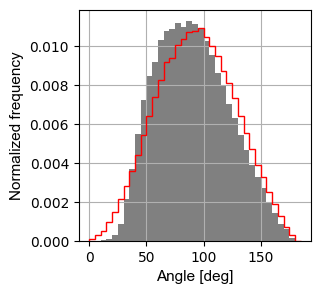

Link angle


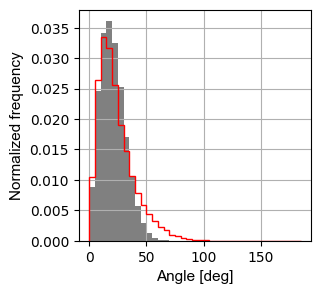

Arm axis angle


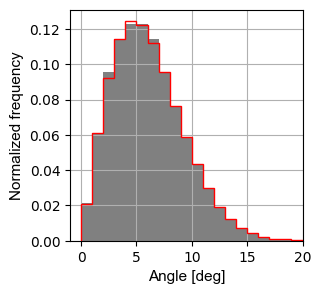

Opposing arm angle


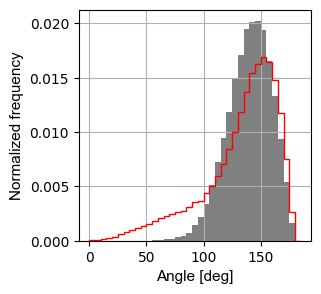

###########################
###########################
###########################
CPU times: user 559 ms, sys: 79.9 ms, total: 639 ms
Wall time: 1.35 s


In [41]:
%%time

folder_names_angle_eval="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/opt_test_2/"

names_ini1="x_opt_test_1_"
names_angle_eval=[[names_ini1+str(l+0)+".h5" for l in range(5)]] #96

names_angles=["Base angle", "Link angle","Arm axis angle","Opposing arm angle"]
for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,oppa_angle_distr_ex_1     ,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_1_4_ba_aa_oa_la(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]
    
    print("Fitness arm axis:", gt_1_1(arm_axis_angle_distr_ex_1,arm_axis_angle_distr_target))
    print("Fitness base+oppa:", gt_1_2(base_angle_distr_ex_1,oppa_angle_distr_ex_1,base_angle_distr_target,oppa_angle_distr_target))
    print("Fitness link:", gt_1_1(link_angle_distr_ex_1,link_angle_distr_target))
    
    for j in range(len(list_angles_eval)):
        fig1=plt.figure(figsize=(3,3))
        ax1 = fig1.add_subplot(111)
        if names_angles[j]=="Arm axis angle":
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='bar',color="grey")[0]
            plt.xlim(-1,20)
        else:
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
        print(names_angles[j])
        ax1.set_ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
        ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
        ax1.grid()
        plt.show()
    print("###########################")
    print("###########################")
    print("###########################")

## hp angle

In [55]:
#copy of sim params
run_sim_1_input_opt_2=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_opt_2.update(dict_opt_params_all_steps)

In [56]:
run_sim_1_input_opt_2["folder"]="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/opt_test_2/"
run_sim_1_input_opt_2["name"]="x_opt_test_hp_1_"
run_sim_1_input_opt_2["add_num_1"]=0
run_sim_1_input_opt_2["use_x_1_HP_template"]=True

In [57]:
#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input_opt_2.copy()
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:17<00:00, 28854.72it/s]


Link HP angle
Fitness hp: 0.9954417008921133


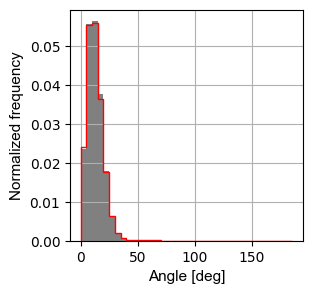

###########################
###########################
###########################
CPU times: user 87.3 ms, sys: 49.9 ms, total: 137 ms
Wall time: 811 ms


In [42]:
%%time

folder_names_angle_eval="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/opt_test_2/"

names_ini1="x_opt_test_hp_1_"
names_angle_eval=[[names_ini1+str(l+0)+".h5" for l in range(5)]]

names_angles="Link HP angle"
for i in range(len(names_angle_eval)):
    link_angle_distr_ex_1, values_angle_link_ex1=cg_angle_distr_1_1_hp(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    
    fig1=plt.figure(figsize=(3,3))
    ax1 = fig1.add_subplot(111)

    sel_target_angle_distr=ax1.hist(list_values_target_angles_1[4]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
    sel_angle_distr=ax1.hist(values_angle_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
    print(names_angles)
    print("Fitness hp:",gt_1_1(sel_angle_distr,sel_target_angle_distr))
    ax1.set_ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
    ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
    ax1.grid()
    plt.show()
    print("###########################")
    print("###########################")
    print("###########################")


## bound arm angles

In [59]:
#copy of sim params
run_sim_1_input_opt_3=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_opt_3.update(dict_opt_params_all_steps)

In [60]:
run_sim_1_input_opt_3["folder"]="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/opt_test_2/"
run_sim_1_input_opt_3["name"]="x_opt_test_ba_1_"
run_sim_1_input_opt_3["add_num_1"]=0
run_sim_1_input_opt_3["checkpoint_path"]="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/two_fused_motifs_checkpoint/"


In [61]:
#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input_opt_3.copy()
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]


Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true



100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:37<00:00, 13489.81it/s]


Bound motifs angle
Fitness ba: 0.9836866343608435


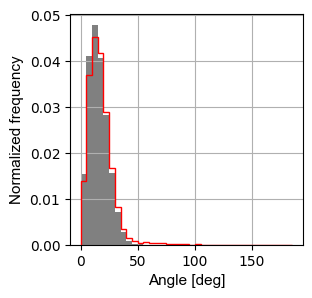

###########################
###########################
###########################
CPU times: user 82 ms, sys: 30 ms, total: 112 ms
Wall time: 322 ms


In [43]:
%%time

folder_names_angle_eval="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/opt_test_2/"

names_ini1="x_opt_test_ba_1_"
names_angle_eval=[[names_ini1+str(l+0)+".h5" for l in range(5)]]

names_angles="Bound motifs angle"
for i in range(len(names_angle_eval)):
    angle_ds_fused_link_distr_ex_1, values_angle_ds_fused_link_ex1=cg_angle_distr_1_1_bm(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    
    fig1=plt.figure(figsize=(3,3))
    ax1 = fig1.add_subplot(111)

    sel_target_angle_distr=ax1.hist(list_values_target_angles_1[5]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
    sel_angle_distr=ax1.hist(values_angle_ds_fused_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
    print(names_angles)
    print("Fitness ba:",gt_1_1(sel_angle_distr,sel_target_angle_distr))
    ax1.set_ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
    ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
    ax1.grid()
    plt.show()
    print("###########################")
    print("###########################")
    print("###########################")


# Fitness evolution

## Arm axis angle

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

Parameter set 0


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

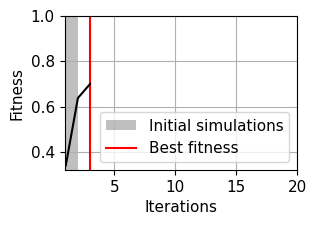

In [53]:
for index, row in df_t1.iterrows():
    fig1=plt.figure(figsize=(3,2))
    #fig, ax1 = plt.subplots(1, 1)
    ax1 = fig1.add_subplot(111)
    fitness_range_l=0.4
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=5
    init_sim_range=2
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.linspace(fitness_range_l,fitness_range_h,fitness_range_step)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontname = "Arial",fontsize=11)
    ax1.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    #ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontname = "Arial",fontsize=11)
    ax1.set_xticks([5,10,15,20],[5,10,15,20],fontname = "Arial",fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontname= "Arial",fontsize=11)
    ax1.legend(loc="lower right",prop={'family': 'Arial','size': 11})
    ax1.grid()
    #plt.savefig("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/figures/fitness_arm_axis_angle_2b.pdf",format="pdf",bbox_inches="tight")


## Base+ oppa angle

Parameter set 0
Parameter set 1


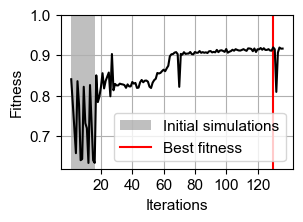

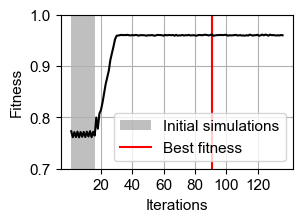

In [45]:
for index, row in df_t2.iterrows():
    fig1=plt.figure(figsize=(3,2))
    #fig, ax1 = plt.subplots(1, 1)
    ax1 = fig1.add_subplot(111)
    fitness_range_l=0.7
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=20
    init_sim_range=16
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.round(np.linspace(fitness_range_l,fitness_range_h,fitness_range_step),1)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontname = "Arial",fontsize=11)
    ax1.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    #ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontname = "Arial",fontsize=11)
    ax1.set_xticks([20,40,60,80,100,120],[20,40,60,80,100,120],fontname = "Arial",fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontname= "Arial",fontsize=11)
    ax1.legend(loc="lower right",prop={'family': 'Arial','size': 11})
    ax1.grid()
    #if param_set==0:
        #plt.savefig("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/figures/fitness_base_oppa_angle_2b.pdf",format="pdf",bbox_inches="tight")


## Bound arms angle

Parameter set 0


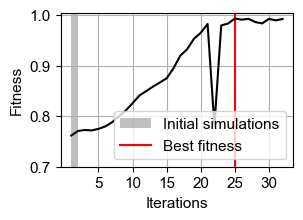

In [46]:
for index, row in df_t4.iterrows():
    fig1=plt.figure(figsize=(3,2))
    #fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
    ax1 = fig1.add_subplot(111)
    fitness_range_l=0.7
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=5
    init_sim_range=2
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.round(np.linspace(fitness_range_l,fitness_range_h,fitness_range_step),1)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontname = "Arial",fontsize=11)
    ax1.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    #ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontname = "Arial",fontsize=11)
    ax1.set_xticks([5,10,15,20,25,30],[5,10,15,20,25,30],fontname = "Arial",fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontname= "Arial",fontsize=11)
    ax1.legend(loc="lower right",prop={'family': 'Arial','size': 11})
    ax1.grid()
    #plt.savefig("/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/figures/fitness_bound_arms_angle_2b.pdf",format="pdf",bbox_inches="tight")


# Compare optimized and unoptimized simulations

## Arm axis angle

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

CPU times: user 277 ms, sys: 143 ms, total: 419 ms
Wall time: 4.93 s


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

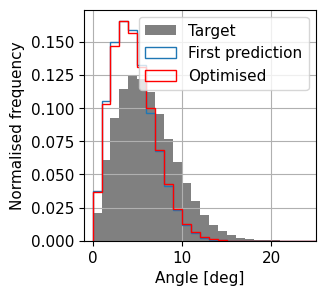

In [55]:
%%time
#guess parameter in middle of range
#folder_names_init_sim="ML_parameter_opt_1/NCG_X_motif_4/unopt_test_2/"
#names_ini1="x_test_1_"

#sim from optimization
folder_names_init_sim="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/"
names_ini1="sim_aa_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/"
#folder_names_opt_sim2="ML_parameter_opt_1/NCG_X_motif_3/opt_test_2/"
#folder_names_opt_sim3="ML_parameter_opt_1/NCG_X_motif_3/opt_test_3/"

names_opt1="x_opt_test_1_"
#names_opt2="x_opt_test_2_"
#names_opt3="x_opt_test_3_"

names_angle_eval=[[names_ini1+str(l+11)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","red"]
names_l=["First prediction","Optimised"]

fig1=plt.figure(figsize=(3,3))
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_arm_axis_target*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='bar',ls="-",color="grey",label="Target")[0]

for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,oppa_angle_distr_ex_1     ,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_1_4_ba_aa_oa_la(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]

    sel_angle_distr=ax1.hist(values_angle_arm_axis_ex_1*180/np.pi,bins=np.arange(0,190,1),density=True,color=colours_l[i], histtype='step',label=names_l[i])[0]


plt.xlim(-1,25)
ax1.legend(loc="upper right",prop={'family': 'Arial','size': 11})
ax1.set_ylabel("Normalised frequency",fontname = "Arial",fontsize=11)
ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
plt.xticks(fontname = "Arial",fontsize=11)
plt.yticks(fontname = "Arial",fontsize=11)

ax1.grid()

#plt.savefig("ML_parameter_opt_1/NCG_X_motif_4/figures/opt_arm_axis_angle_3.pdf",format="pdf",bbox_inches="tight")



## Base angle

CPU times: user 71.1 ms, sys: 95.7 ms, total: 167 ms
Wall time: 1.38 s


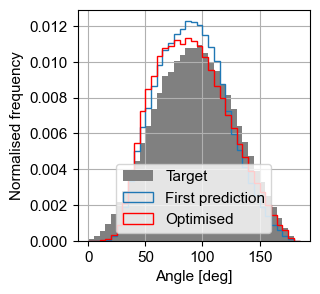

In [22]:
%%time

#guess parameter in middle of range
#folder_names_init_sim="ML_parameter_opt_1/NCG_X_motif_4/unopt_test_2/"
#names_ini1="x_test_1_"

#sim from optimization
folder_names_init_sim="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/ba_oa_la_opt_2/"
names_ini1="sim_ba_oa_la_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/opt_test_2/"
#folder_names_opt_sim2="ML_parameter_opt_1/NCG_X_motif_3/opt_test_2/"
#folder_names_opt_sim3="ML_parameter_opt_1/NCG_X_motif_3/opt_test_3/"

names_opt1="x_opt_test_1_"
#names_opt2="x_opt_test_2_"
#names_opt3="x_opt_test_3_"

names_angle_eval=[[names_ini1+str(l+81)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","red"]
names_l=["First prediction","Optimised"]

fig1=plt.figure(figsize=(3,3))
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_base_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="grey",label="Target")[0]


for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,oppa_angle_distr_ex_1     ,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_1_4_ba_aa_oa_la(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]

    sel_angle_distr=ax1.hist(values_angle_base_ex_1*180/np.pi,bins=np.arange(0,190,5),density=True, color=colours_l[i],histtype='step',label=names_l[i])[0]

#plt.xlim(-1,50)
ax1.legend(loc="lower center",prop={'family': 'Arial','size': 11})
ax1.set_ylabel("Normalised frequency",fontname = "Arial",fontsize=11)
ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
plt.xticks(fontname = "Arial",fontsize=11)
plt.yticks(fontname = "Arial",fontsize=11)
ax1.grid()

#plt.savefig("ML_parameter_opt_1/NCG_X_motif_4/figures/opt_base_angle_3.pdf",format="pdf",bbox_inches="tight")




## Oppa angle

CPU times: user 120 ms, sys: 42.1 ms, total: 162 ms
Wall time: 1.38 s


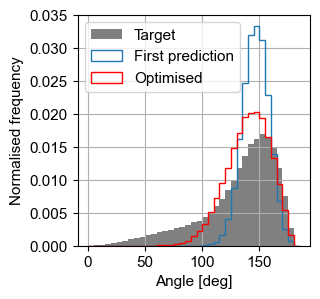

In [21]:
%%time
#guess parameter in middle of range
#folder_names_init_sim="ML_parameter_opt_1/NCG_X_motif_4/unopt_test_2/"
#names_ini1="x_test_1_"

#sim from optimization
folder_names_init_sim="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/ba_oa_la_opt_2/"
names_ini1="sim_ba_oa_la_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/opt_test_2/"
#folder_names_opt_sim2="ML_parameter_opt_1/NCG_X_motif_3/opt_test_2/"
#folder_names_opt_sim3="ML_parameter_opt_1/NCG_X_motif_3/opt_test_3/"

names_opt1="x_opt_test_1_"
#names_opt2="x_opt_test_2_"
#names_opt3="x_opt_test_3_"

names_angle_eval=[[names_ini1+str(l+81)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","red"]
names_l=["First prediction","Optimised"]


fig1=plt.figure(figsize=(3,3))
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_oppa_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="grey",label="Target")[0]

for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,oppa_angle_distr_ex_1     ,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_1_4_ba_aa_oa_la(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]

    sel_angle_distr=ax1.hist(values_angle_oppa_ex_test_1*180/np.pi,bins=np.arange(0,190,5),density=True,color=colours_l[i], histtype='step',label=names_l[i])[0]


#plt.xlim(-1,50)
ax1.legend(loc="upper left",prop={'family': 'Arial','size': 11})
ax1.set_ylabel("Normalised frequency",fontname = "Arial",fontsize=11)
ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
plt.xticks(fontname = "Arial",fontsize=11)
plt.yticks(fontname = "Arial",fontsize=11)
ax1.grid()


#plt.savefig("ML_parameter_opt_1/NCG_X_motif_4/figures/opt_oppa_angle_3.pdf",format="pdf",bbox_inches="tight")



## Link angle

CPU times: user 68.5 ms, sys: 87.6 ms, total: 156 ms
Wall time: 1.37 s


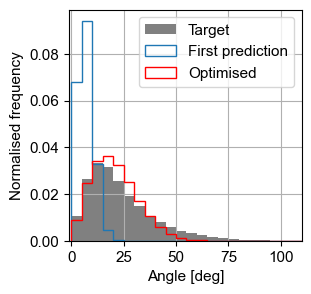

In [18]:
%%time
#guess parameter in middle of range
#folder_names_init_sim="ML_parameter_opt_1/NCG_X_motif_4/unopt_test_2/"
#names_ini1="x_test_1_"

#sim from optimization
folder_names_init_sim="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/ba_oa_la_opt_2/"
names_ini1="sim_ba_oa_la_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/opt_test_2/"
#folder_names_opt_sim2="ML_parameter_opt_1/NCG_X_motif_3/opt_test_2/"
#folder_names_opt_sim3="ML_parameter_opt_1/NCG_X_motif_3/opt_test_3/"

names_opt1="x_opt_test_1_"
#names_opt2="x_opt_test_2_"
#names_opt3="x_opt_test_3_"

names_angle_eval=[[names_ini1+str(l+81)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","red"]
names_l=["First prediction","Optimised"]


fig1=plt.figure(figsize=(3,3))
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_link_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="grey",label="Target")[0]

for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,oppa_angle_distr_ex_1     ,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_1_4_ba_aa_oa_la(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]

    sel_angle_distr=ax1.hist(values_angle_link_ex_1*180/np.pi,bins=np.arange(0,190,5),density=True, color=colours_l[i],histtype='step',label=names_l[i])[0]


plt.xlim(-1,110)
ax1.legend(loc="upper right",prop={'family': 'Arial','size': 11})
ax1.set_ylabel("Normalised frequency",fontname = "Arial",fontsize=11)
ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
plt.xticks(fontname = "Arial",fontsize=11)
plt.yticks(fontname = "Arial",fontsize=11)
ax1.grid()


#plt.savefig("ML_parameter_opt_1/NCG_X_motif_4/figures/opt_link_angle_3.pdf",format="pdf",bbox_inches="tight")



## HP link angle

CPU times: user 100 ms, sys: 61.7 ms, total: 162 ms
Wall time: 1.41 s


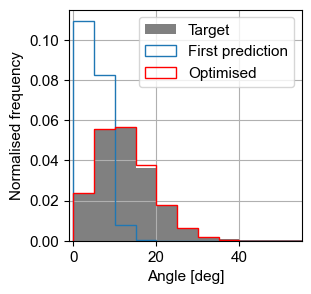

In [17]:
%%time

#guess parameter in middle of range
#folder_names_init_sim="ML_parameter_opt_1/NCG_X_motif_4/unopt_test_2/"
#names_ini1="x_test_hp_1_"

#sim from optimization
folder_names_init_sim="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/hp_opt_2/"
names_ini1="sim_hp_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/opt_test_2/"
#folder_names_opt_sim2="ML_parameter_opt_1/NCG_X_motif_3/opt_test_2/"
#folder_names_opt_sim3="ML_parameter_opt_1/NCG_X_motif_3/opt_test_3/"

names_opt1="x_opt_test_hp_1_"
#names_opt2="x_opt_test_hp_2_"
#names_opt3="x_opt_test_hp_3_"

names_angle_eval=[[names_ini1+str(l+11)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","red"]
names_l=["First prediction","Optimised"]


fig1=plt.figure(figsize=(3,3))
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_link_HP_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="grey",label="Target")[0]

for i in range(len(names_angle_eval)):
    link_angle_distr_ex_1, values_angle_link_ex1=cg_angle_distr_1_1_hp(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)

    sel_angle_distr=ax1.hist(values_angle_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True,color=colours_l[i], histtype='step',label=names_l[i])[0]


plt.xlim(-1,55)
ax1.legend(loc="upper right",prop={'family': 'Arial','size': 11})
ax1.set_ylabel("Normalised frequency",fontname = "Arial",fontsize=11)
ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
plt.xticks(fontname = "Arial",fontsize=11)
plt.yticks(fontname = "Arial",fontsize=11)
ax1.grid()


#plt.savefig("ML_parameter_opt_1/NCG_X_motif_4/figures/opt_HP_link_angle_3.pdf",format="pdf",bbox_inches="tight")



## bound arms angle

CPU times: user 31.8 ms, sys: 71.6 ms, total: 103 ms
Wall time: 433 ms


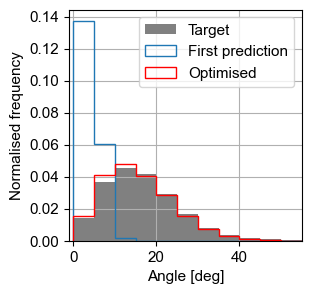

In [16]:
%%time

#guess parameter in middle of range
#folder_names_init_sim="ML_parameter_opt_1/NCG_X_motif_4/unopt_test_2/"
#names_ini1="x_test_ba_1_"

#sim from optimization
folder_names_init_sim="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/bm_opt_2/"
names_ini1="sim_bm_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/xenia/Masterthesis_ReaDDy/Nanomotif_Coarse_Graining_1/NCG_X_motif_4/opt_test_2/"
#folder_names_opt_sim2="ML_parameter_opt_1/NCG_X_motif_3/opt_test_2/"
#folder_names_opt_sim3="ML_parameter_opt_1/NCG_X_motif_3/opt_test_3/"

names_opt1="x_opt_test_ba_1_"
#names_opt2="x_opt_test_ba_2_"
#names_opt3="x_opt_test_ba_3_"

names_angle_eval=[[names_ini1+str(l+11)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","red"]
names_l=["First prediction","Optimised"]


fig1=plt.figure(figsize=(3,3))
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_ds_fused_link_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="grey",label="Target")[0]

for i in range(len(names_angle_eval)):
    angle_ds_fused_link_distr_ex_1, values_angle_ds_fused_link_ex1=cg_angle_distr_1_1_bm(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)

    sel_angle_distr=ax1.hist(values_angle_ds_fused_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True,color=colours_l[i], histtype='step',label=names_l[i])[0]


plt.xlim(-1,55)
ax1.legend(loc="upper right",prop={'family': 'Arial','size': 11})
ax1.set_ylabel("Normalised frequency",fontname = "Arial",fontsize=11)
ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
plt.xticks(fontname = "Arial",fontsize=11)
plt.yticks(fontname = "Arial",fontsize=11)
ax1.grid()


#plt.savefig("ML_parameter_opt_1/NCG_X_motif_4/figures/opt_bound_arms_angle_3.pdf",format="pdf",bbox_inches="tight")

